# Multimodal Fusion: Late fusion
<style>
h2: color:blue;
</style>

# Section 0: Import modules, set variables, load functions 

In [2]:
%load_ext autoreload
%autoreload 2

import os
import numpy as np
import pandas as pd
from keras import backend as K
from sklearn.metrics import confusion_matrix    
from sklearn import metrics
from keras.models import Model
from keras.layers import Dense, Reshape, concatenate, Lambda, Average, Maximum, Add, Multiply, Concatenate, BatchNormalization, Activation
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from keras.layers.embeddings import Embedding
from keras.engine.input_layer import Input
from keras.optimizers import Adam
from utils import *
from keras.activations import relu
from sklearn.model_selection import StratifiedKFold
import random
import dill
import matplotlib.pyplot as plt
from scipy import ndimage
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from PIL import Image
import io
from keras.utils.training_utils import multi_gpu_model
import tensorflow as tf

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
from keras import backend as K
print(K.tensorflow_backend._get_available_gpus())
G = len(K.tensorflow_backend._get_available_gpus())

['/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1']


In [4]:
SRC = 'PMC'

if SRC=='PMC':
    CLASSES = {0: 'bar', 1: 'gel', 2: 'map', 3: 'network', 4: 'plot',
             5: 'text', 6: 'box', 7: 'heatmap',8: 'medical', 9: 'nxmls', 10: 'screenshot',
             11: 'topology', 12: 'diagram', 13: 'histology', 14: 'microscopy',
             15: 'photo', 16: 'sequence', 17: 'tree', 18: 'fluorescence', 19: 'line',
             20: 'molecular', 21: 'pie', 22: 'table'}
    
    class_names = ['bar', 'gel', 'network', 'plot', 'histology', 'sequence',
                               'line', 'molecular']
else:
    class_names = ['cat','dog']
num_class = len(class_names)
NN_Class_Names = dict(enumerate(class_names))
test_size = 0.2
epochs = 150
#Set parameters
create_word_vec = False
w2v_epochs = 20
w2v_window_size=5
w2v_filters=''
seed = 0
max_text_len = 200
vocabulary_size = 10000
csv_fname = 'image_list.csv'
coco_loc = '/home/kevin/Documents/Lab/coco_dataset'
pmc_loc = '/gpfs/ysm/pi/krauthammer/kl533/'
filters = ''
use_glove = False
LOAD_IMG_MODEL_WEIGHTS = False
LOAD_TXT_MODEL_WEIGHTS = False
CHANNELS = 3#should be either 3 or 1 for the number of channels
shape = (100,100,CHANNELS)#image shape
embedding_output_dim = 100
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6, verbose=1)
early_stopping = EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=0, mode='auto', baseline=None)
nltk.download('punkt')
nltk.download('stopwords')
plt.rcParams["figure.dpi"] = 600
n_splits=5

[nltk_data] Downloading package punkt to /home/kl533/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/kl533/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
def Generate_Model(image = True, text = True):
    #set up our text input
    if image and text:
        input_text = Input(shape=(max_text_len,), name='text_input')
        embedding = Embedding(input_length=max_text_len, input_dim=vocabulary_size, output_dim=embedding_output_dim, 
                               name='embedding_layer', trainable=True, weights=[embedding_weights])
        text_embedding = embedding(input_text)
        #set up our image branch
        image_input = Input(shape, name='image_input')
        image_branch = get_img_branch()(image_input)
        image_branch = Dense(1024, activation='relu', name='dense_layer1_image_branch')(image_branch)
        image_branch = BatchNormalization()(image_branch)
        image_branch = Dropout(0.5)(image_branch)        
        image_branch = Dense(512, activation='relu', name='dense_layer2_image_branch')(image_branch)
        image_branch = BatchNormalization()(image_branch)
        image_branch = Dropout(0.5)(image_branch)
        image_branch_out = Dense(num_class, activation='softmax', name='image_branch_output')(image_branch)
        image_branch_model = Model(inputs=[image_input], outputs=[image_branch_out])
        #set up text branch
        text_branch = get_text_branch()(text_embedding)
        text_branch = Dense(1024, activation='relu', name='dense_layer1_text_branch')(text_branch)
        text_branch = BatchNormalization()(text_branch)
        text_branch = Dropout(0.5)(text_branch)        
        text_branch = Dense(512, activation='relu', name='dense_layer2_text_branch')(text_branch)
        text_branch = BatchNormalization()(text_branch)
        text_branch = Dropout(0.5)(text_branch)
        text_branch_out = Dense(num_class, activation='softmax', name='text_branch_output')(text_branch)
        text_branch_model = Model(inputs=[input_text], outputs=[text_branch_out])
        outputs = [model.outputs[0] for model in [text_branch_model, image_branch_model]]
        output = Average()(outputs)
        classificationModel = Model(inputs=[text_branch_model.input, image_branch_model.input], outputs=[output])
    if image and not text:#image only
        image_input = Input(shape, name='image_input')
        x = get_img_branch()(image_input)
        x = Dense(1024, activation='relu', name='dense_layer1_image')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)        
        x = Dense(512, activation='relu', name='dense_layer2_image')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        output = Dense(num_class, activation='softmax', name='image_output')(x)
        classificationModel = Model(inputs=[image_input], outputs=[output])
    if not image and text:#text only
        input_text = Input(shape=(max_text_len,), name='text_input')
        embedding = Embedding(input_length=max_text_len, input_dim=vocabulary_size, output_dim=embedding_output_dim, 
                               name='embedding_layer', trainable=True, weights=[embedding_weights])
        embedded_text = embedding(input_text)
        x = get_text_branch()(embedded_text)
        x = Dense(1024, activation='relu', name='dense_layer1_text')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)        
        x = Dense(512, activation='relu', name='dense_layer2_text')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        output = Dense(num_class, activation='softmax', name='text_output')(x)
        classificationModel = Model(inputs=[input_text], outputs=[output])
    if G > 1:
        classificationModel = get_multi_gpu_model(classificationModel, G)
    return classificationModel

<hr/>

# Section 1: Initalize variables and load data

In [6]:
# Load our data from source

print('Getting Data')
if SRC == 'PMC':
    image_classes = [list(CLASSES.keys())[list(CLASSES.values()).index(x)] for 
                 x in class_names]  
    data = load_PMC(csv_fname, image_classes, uniform=True)
    #dynamically add location of files
    data['location'] = pmc_loc + data['location'].astype(str)
else:
    data = load_COCO(coco_loc, class_names=class_names)

Getting Data


## Optional: Create embeddings

In [7]:
#%%Section 0.5 create embeddings - Optional
if create_word_vec:
    print('Section 0.5: create embeddings')
    from w2v_keras import w2v_keras
    w2v = w2v_keras(vocabulary_size=vocabulary_size, window_size=w2v_window_size, filters=w2v_filters, vector_dim = embedding_output_dim)
    w2v.fit(data['caption'], epochs=w2v_epochs)
    w2v.save_embeddings('w2v_embeddings.json')
else:
    print("Not creating embeddings")

## Get data into format our model understands

In [8]:
#%% Section 1: Generate our sequences from text
print('Get model data')
(X_text_train, X_text_test, X_image_train, X_image_test, y_train, y_test, 
 tokenizer) = get_model_data(data, seed=seed, test_size = test_size, vocabulary_size = vocabulary_size, 
          filters = filters, max_text_len=max_text_len, shape=shape)

Get model data
filtering sentences
filtering sents and removing stopwords
filtering sentences
filtering sents and removing stopwords
filtering sentences
filtering sents and removing stopwords


/home/kl533/.local/lib/python3.6/site-packages/sklearn/preprocessing/_encoders.py:363: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


## Load our word embeddings

In [9]:
#%% Section 1.5: Load word embeddings
if use_glove:
    embedding_weights = load_glove('/home/kevin/Downloads', 
                        take(vocabulary_size, tokenizer.word_index.items()))
elif create_word_vec:#get weights from w2v model directly if trained.
    embedding_weights = mapTokensToEmbedding(w2v.get_embeddings(), 
                                             tokenizer.word_index, vocabulary_size)
else:
    #load embedding weights from file
    location = 'w2v_embeddings.json'
    import json
    with open(location) as f:
        embs = json.load(f)
        emb = json.loads(embs)
    embedding_weights = mapTokensToEmbedding(emb, tokenizer.word_index, 
                                             vocabulary_size)

## Lets visualize our models:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


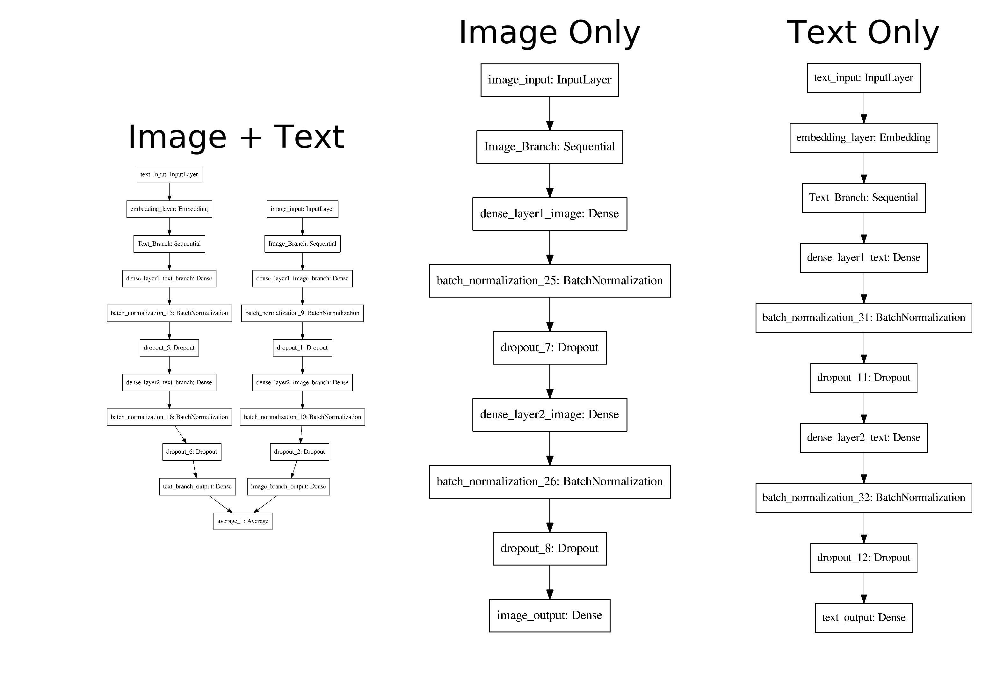

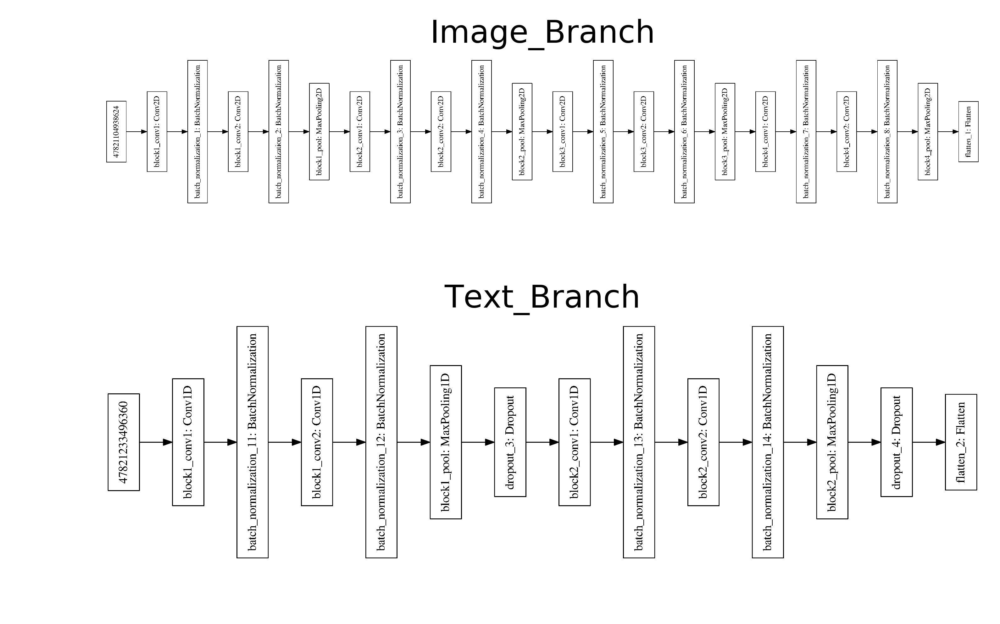

In [10]:
G_bak = G
G = 1
text_image_model_vis = Generate_Model(image = True, text=True)
image_model_vis = Generate_Model(image = True, text=False)
text_model_vis = Generate_Model(image = False, text=True)
G = G_bak
model_list = {'Image + Text': text_image_model_vis, 'Image Only': image_model_vis, 
              'Text Only': text_model_vis}
base_model_list = {'Image_Branch': text_image_model_vis.get_layer('Image_Branch'), 
                   'Text_Branch': text_image_model_vis.get_layer('Text_Branch')}
plt.rcParams["figure.dpi"] = 600
fig,ax = plt.subplots(1,len(model_list))

for i, (name,model) in enumerate(model_list.items()):
    x = model_to_dot(model)
    x.set_dpi(600)
    x = x.create(prog='dot', format='png')
    x_ = plt.imread(io.BytesIO(x))
    ax[i].imshow(x_)
    ax[i].axis("off")
    ax[i].set_title(name)

fig,ax = plt.subplots(len(base_model_list),1)
for i, (name,model) in enumerate(base_model_list.items()):
    x = model_to_dot(model)
    x.set_dpi(600)
    x = x.create(prog='dot', format='png')
    x_ = plt.imread(io.BytesIO(x))
    x_ = ndimage.rotate(x_, 90)
    ax[i].imshow(x_)
    ax[i].axis("off")
    ax[i].set_title(name)

In [11]:
print(G)

2


# Section 2: Train Test Split

## Train with only images

### Generate model and load callbacks

In [12]:
print('Train with only images')
image_model = Generate_Model(image=True, text=False)
image_model.compile(optimizer='adam',
          loss='categorical_crossentropy',
          metrics=['accuracy'])
filepath="late_fusion_weights/weights-improvement_image_only.hdf5"
if LOAD_IMG_MODEL_WEIGHTS:
    print ('Loading image model weights')
    image_model.load_weights(filepath)
checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr, checkpoint, early_stopping]

Train with only images
[INFO] training with 2 GPUs...


### Train model

In [13]:
history = image_model.fit([X_image_train],[y_train], 
                         epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)

Train on 2263 samples, validate on 252 samples
Epoch 1/150
2263/2263 [==============================] - 14s 6ms/step - loss: 2.4177 - acc: 0.3385 - val_loss: 4.2849 - val_acc: 0.2659

Epoch 00001: val_acc improved from -inf to 0.26587, saving model to late_fusion_weights/weights-improvement_image_only.hdf5
Epoch 2/150
2263/2263 [==============================] - 3s 1ms/step - loss: 1.7595 - acc: 0.4737 - val_loss: 2.5905 - val_acc: 0.4325

Epoch 00002: val_acc improved from 0.26587 to 0.43254, saving model to late_fusion_weights/weights-improvement_image_only.hdf5
Epoch 3/150
2263/2263 [==============================] - 3s 1ms/step - loss: 1.3833 - acc: 0.5555 - val_loss: 1.7040 - val_acc: 0.5198

Epoch 00003: val_acc improved from 0.43254 to 0.51984, saving model to late_fusion_weights/weights-improvement_image_only.hdf5
Epoch 4/150
2263/2263 [==============================] - 3s 1ms/step - loss: 1.2105 - acc: 0.6072 - val_loss: 1.9704 - val_acc: 0.5873

Epoch 00004: val_acc improved 


Epoch 00037: val_acc did not improve from 0.81746
Epoch 38/150
2263/2263 [==============================] - 2s 1ms/step - loss: 0.0128 - acc: 0.9978 - val_loss: 0.7947 - val_acc: 0.8095

Epoch 00038: val_acc did not improve from 0.81746
Epoch 39/150
2263/2263 [==============================] - 2s 1ms/step - loss: 0.0159 - acc: 0.9969 - val_loss: 0.7981 - val_acc: 0.8056

Epoch 00039: val_acc did not improve from 0.81746
Epoch 40/150
2263/2263 [==============================] - 2s 1ms/step - loss: 0.0161 - acc: 0.9973 - val_loss: 0.8035 - val_acc: 0.8016

Epoch 00040: val_acc did not improve from 0.81746
Epoch 41/150
2263/2263 [==============================] - 3s 1ms/step - loss: 0.0156 - acc: 0.9956 - val_loss: 0.8063 - val_acc: 0.8016

Epoch 00041: val_acc did not improve from 0.81746
Epoch 42/150
2263/2263 [==============================] - 2s 1ms/step - loss: 0.0133 - acc: 0.9978 - val_loss: 0.8074 - val_acc: 0.8016

Epoch 00042: ReduceLROnPlateau reducing learning rate to 1.60000

### Plot training history

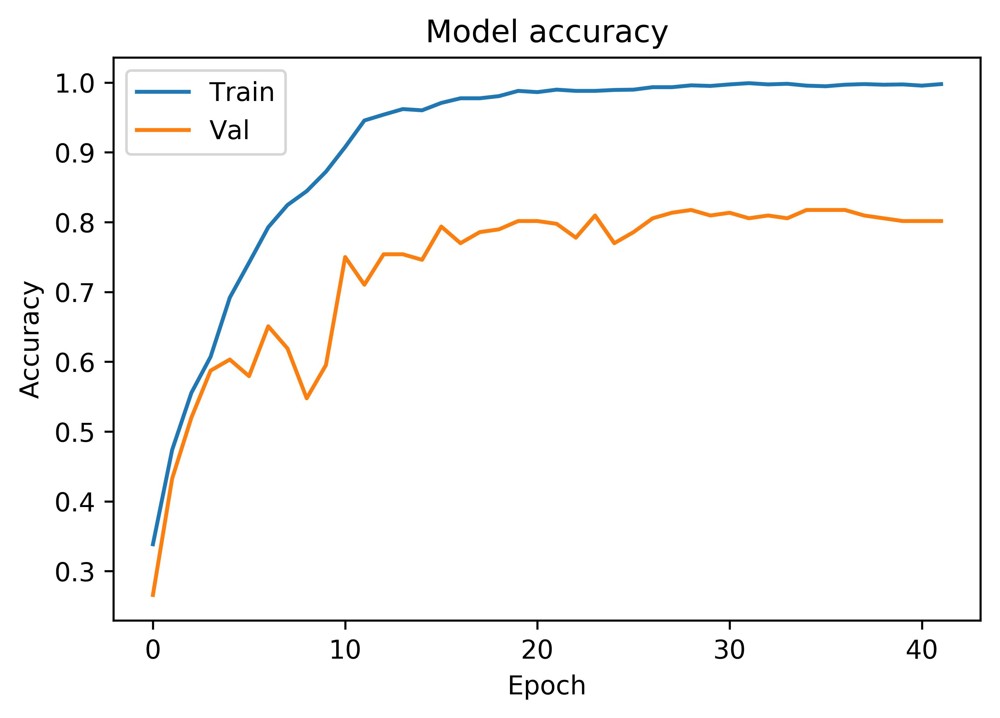

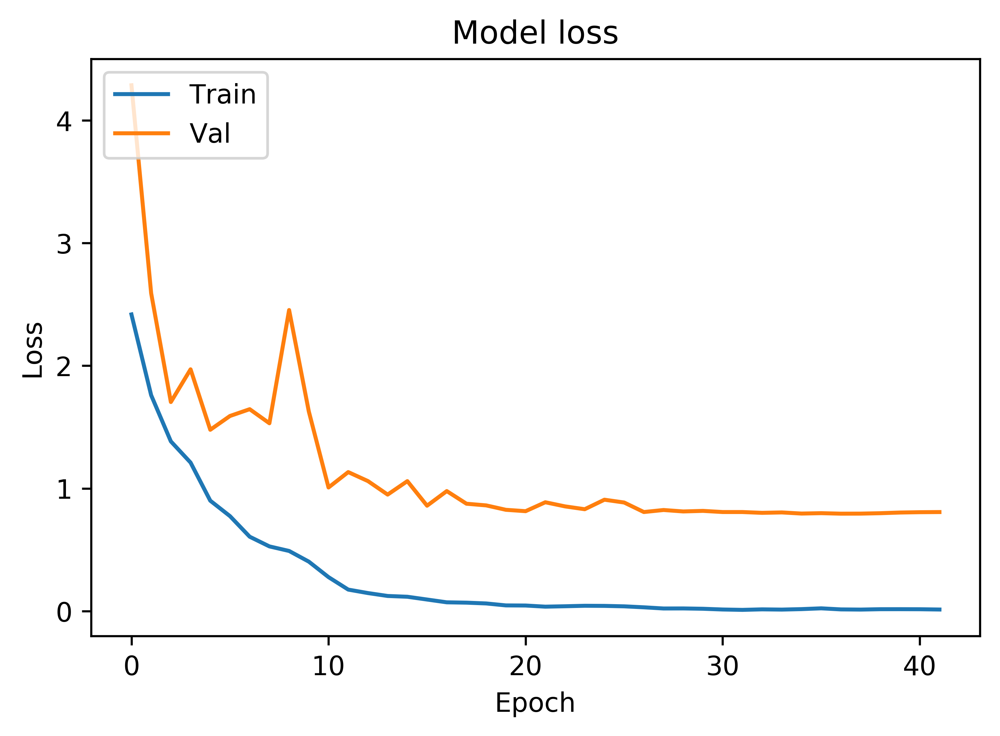

In [14]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### Test model

In [15]:
y_hat = test_model(image_model, zip(X_image_test, y_test), image = True, text = False, class_names=class_names)

629/629 [==============================] - 1s 1ms/step
[0.8252760406897444, 0.8251192371682257]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         65    1        1     1          1         0     3          0
gel          1   82        5     3          1         0     0          0
network      2    2       52     1          0         2     2          4
plot         5    0        6    64          0         0    11          0
histology    0    3        1     0         72         0     0          0
sequence     1    3        4     1          0        63     1          1
line         4    0        8    10          0         3    56          5
molecular    0    0        8     2          2         0     1         65
              precision    recall  f1-score   support

         bar       0.83      0.90      0.87        72
         gel       0.90      0.89      0.90        92
     network       0.61      0.80      0.69        65
        plot       0.78      0

## Train with only text

### Generate model and load callbacks

In [16]:
print('Train with only text')
text_model = Generate_Model(image=False, text=True)
text_model.compile(optimizer='adam',
          loss='categorical_crossentropy',
          metrics=['accuracy'])
filepath="late_fusion_weights/weights-improvement_text_only.hdf5"
if LOAD_TXT_MODEL_WEIGHTS:
    print ('Loading text model weights')
    text_model.load_weights(filepath)
checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr, checkpoint, early_stopping]

Train with only text
[INFO] training with 2 GPUs...


### Train model

In [17]:
history = text_model.fit([X_text_train],[y_train], 
                         epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)

Train on 2263 samples, validate on 252 samples
Epoch 1/150
2263/2263 [==============================] - 5s 2ms/step - loss: 2.7831 - acc: 0.2218 - val_loss: 1.7420 - val_acc: 0.4206

Epoch 00001: val_acc improved from -inf to 0.42063, saving model to late_fusion_weights/weights-improvement_text_only.hdf5
Epoch 2/150
2263/2263 [==============================] - 0s 170us/step - loss: 2.0875 - acc: 0.3570 - val_loss: 1.3672 - val_acc: 0.5238

Epoch 00002: val_acc improved from 0.42063 to 0.52381, saving model to late_fusion_weights/weights-improvement_text_only.hdf5
Epoch 3/150
2263/2263 [==============================] - 0s 154us/step - loss: 1.6268 - acc: 0.4635 - val_loss: 1.1619 - val_acc: 0.6071

Epoch 00003: val_acc improved from 0.52381 to 0.60714, saving model to late_fusion_weights/weights-improvement_text_only.hdf5
Epoch 4/150
2263/2263 [==============================] - 0s 153us/step - loss: 1.3216 - acc: 0.5568 - val_loss: 1.1151 - val_acc: 0.6151

Epoch 00004: val_acc improve

### Plot training history

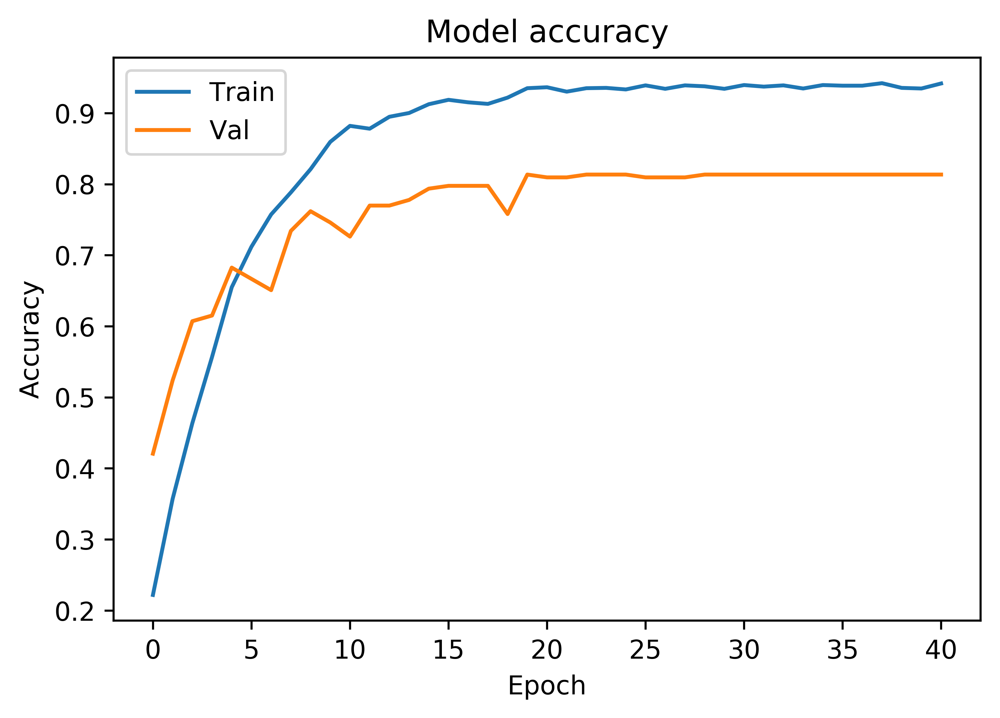

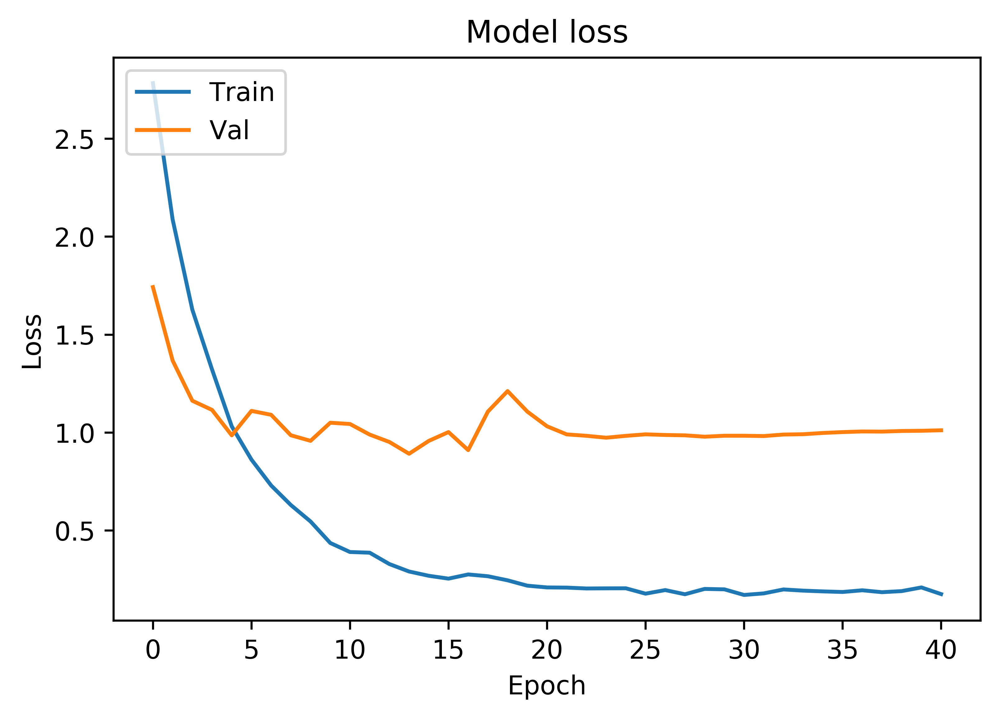

In [18]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### Test model

In [19]:
y_hat = test_model(text_model, zip(X_text_test, y_test), image = False, text = True, class_names=class_names)

629/629 [==============================] - 0s 333us/step
[0.9990607996623733, 0.7869634344013013]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         46    5        1     3          7         0     9          1
gel          5   67        0     0         12         1     7          0
network      4    0       50     1          5         0     2          3
plot         7    1        1    62          6         1     7          1
histology    0    0        2     1         71         0     2          0
sequence     2    1        0     0          1        68     2          0
line         9    1        2     5          0         0    69          0
molecular    1    0        5     0          7         2     1         62
              precision    recall  f1-score   support

         bar       0.62      0.64      0.63        72
         gel       0.89      0.73      0.80        92
     network       0.82      0.77      0.79        65
        plot       0.86     

## Model fusion: Test with images and text

In [20]:
#Take the image model and text model and merge it
outputs = [model.outputs[0] for model in [text_model.layers[-2], image_model.layers[-2]]]
output = Average()(outputs)    
text_image_model = Model(inputs=[text_model.input, image_model.input], outputs=[output])
#text_image_model = get_multi_gpu_model(text_image_model, G)
text_image_model.compile(optimizer='adam',
          loss='categorical_crossentropy',
          metrics=['accuracy'])
filepath="late_fusion_weights/weights-improvement_image_text_only.hdf5"
checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr, checkpoint, early_stopping]
y_hat = test_model(text_image_model, zip(X_text_test, X_image_test, y_test), image = True, text = True)

629/629 [==============================] - 2s 4ms/step
[0.406359246216821, 0.903020667916072]
    0   1   2   3   4   5   6   7
0  65   0   1   2   1   0   2   1
1   2  84   1   0   2   0   3   0
2   0   0  59   0   1   1   1   3
3   7   1   2  71   2   0   2   1
4   0   1   0   0  75   0   0   0
5   0   2   0   0   0  71   0   1
6   2   0   4   7   0   1  72   0
7   0   0   5   0   2   0   0  71
              precision    recall  f1-score   support

           0       0.86      0.90      0.88        72
           1       0.95      0.91      0.93        92
           2       0.82      0.91      0.86        65
           3       0.89      0.83      0.86        86
           4       0.90      0.99      0.94        76
           5       0.97      0.96      0.97        74
           6       0.90      0.84      0.87        86
           7       0.92      0.91      0.92        78

   micro avg       0.90      0.90      0.90       629
   macro avg       0.90      0.91      0.90       629
weig

### Model fusion: Train with images and text using pretrained branches

In [21]:
history = text_image_model.fit([X_text_train, X_image_train],[y_train], 
                         epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)

Train on 2263 samples, validate on 252 samples
Epoch 1/150
2263/2263 [==============================] - 12s 5ms/step - loss: 0.2951 - acc: 0.9333 - val_loss: 1.2615 - val_acc: 0.7302

Epoch 00001: val_acc improved from -inf to 0.73016, saving model to late_fusion_weights/weights-improvement_image_text_only.hdf5
Epoch 2/150
2263/2263 [==============================] - 4s 2ms/step - loss: 0.3217 - acc: 0.9103 - val_loss: 0.8118 - val_acc: 0.7183

Epoch 00002: val_acc did not improve from 0.73016
Epoch 3/150
2263/2263 [==============================] - 4s 2ms/step - loss: 0.3016 - acc: 0.9191 - val_loss: 1.2146 - val_acc: 0.6190

Epoch 00003: val_acc did not improve from 0.73016
Epoch 4/150
2263/2263 [==============================] - 4s 2ms/step - loss: 0.2434 - acc: 0.9470 - val_loss: 0.7142 - val_acc: 0.7659

Epoch 00004: val_acc improved from 0.73016 to 0.76587, saving model to late_fusion_weights/weights-improvement_image_text_only.hdf5
Epoch 5/150
2263/2263 [========================

2263/2263 [==============================] - 4s 2ms/step - loss: 0.0484 - acc: 0.9960 - val_loss: 0.4460 - val_acc: 0.9206

Epoch 00039: val_acc did not improve from 0.92460
Epoch 40/150
2263/2263 [==============================] - 4s 2ms/step - loss: 0.0469 - acc: 0.9938 - val_loss: 0.4467 - val_acc: 0.9206

Epoch 00040: val_acc did not improve from 0.92460
Epoch 41/150
2263/2263 [==============================] - 4s 2ms/step - loss: 0.0467 - acc: 0.9947 - val_loss: 0.4469 - val_acc: 0.9206

Epoch 00041: val_acc did not improve from 0.92460
Epoch 42/150
2263/2263 [==============================] - 4s 2ms/step - loss: 0.0457 - acc: 0.9951 - val_loss: 0.4475 - val_acc: 0.9206

Epoch 00042: ReduceLROnPlateau reducing learning rate to 1e-06.

Epoch 00042: val_acc did not improve from 0.92460
Epoch 43/150
2263/2263 [==============================] - 4s 2ms/step - loss: 0.0471 - acc: 0.9947 - val_loss: 0.4467 - val_acc: 0.9206

Epoch 00043: val_acc did not improve from 0.92460
Epoch 44/150


### Plot training history

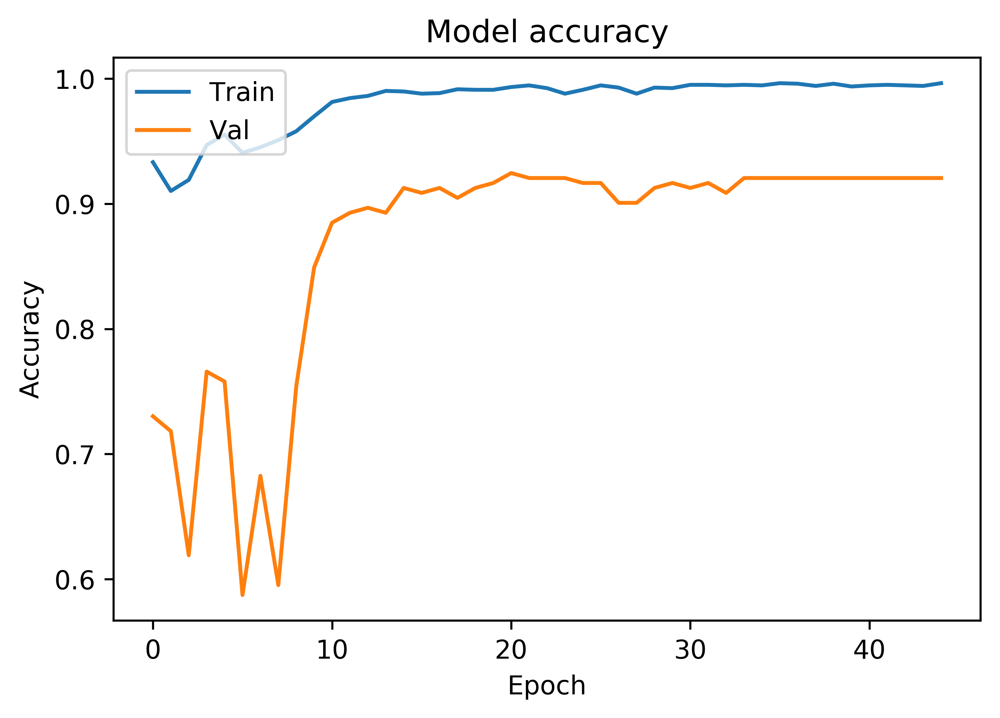

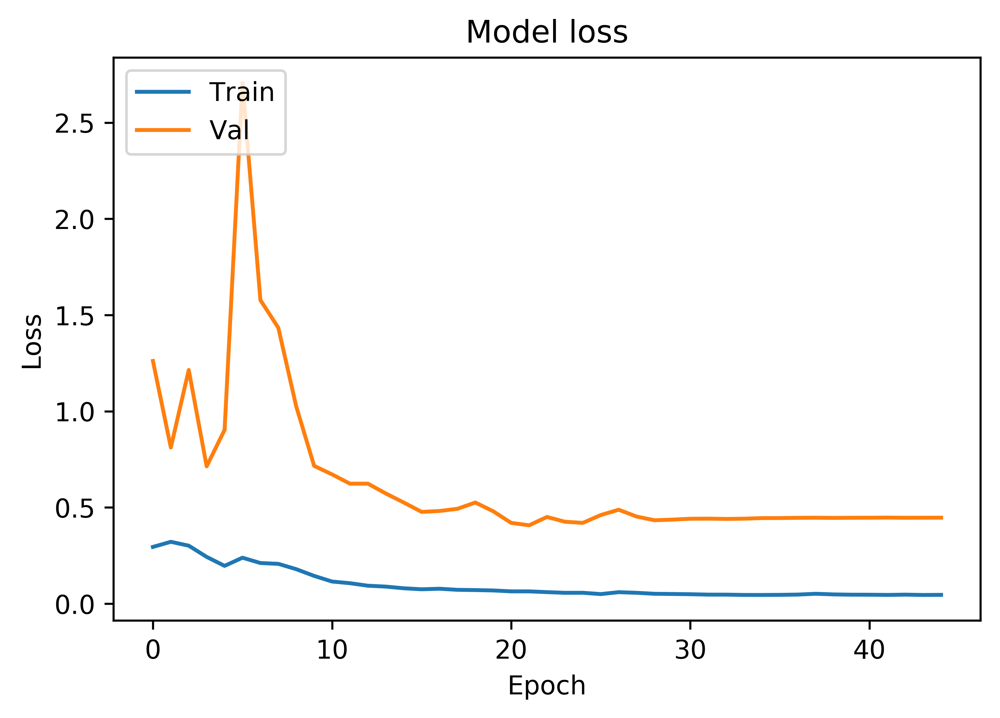

In [22]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### Test model after we trained on pretrained branches

In [23]:
y_hat = test_model(text_image_model, zip(X_text_test, X_image_test, y_test), image = True, text = True, class_names=class_names)

629/629 [==============================] - 1s 814us/step
[0.46760379135703434, 0.9141494436559692]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         64    1        2     1          2         0     1          1
gel          2   83        1     1          1         0     4          0
network      0    0       60     1          1         0     1          2
plot         4    1        2    74          2         0     3          0
histology    0    1        0     0         75         0     0          0
sequence     1    1        0     0          0        71     0          1
line         2    0        4     5          0         0    75          0
molecular    0    0        3     0          1         1     0         73
              precision    recall  f1-score   support

         bar       0.88      0.89      0.88        72
         gel       0.95      0.90      0.93        92
     network       0.83      0.92      0.88        65
        plot       0.90    

### Inspect misclassifications

In [ ]:
y_hat = text_image_model.predict([X_text_test, X_image_test])
#convert to categorical from one-hot
y_hat_fig = [ np.argmax(t) for t in y_hat ]
y_test_fig = [ np.argmax(t) for t in y_test ]
test_wrong = [im for im in zip(X_image_test, y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')

### Train Image + Text model from scratch

In [24]:
text_image_model = Generate_Model(image = True, text=True)
#set optimizer:
optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, decay=0.0005, amsgrad=True) #RMSprop(lr=0.001, rho=0.9, epsilon=1e-07, decay=0.0)
text_image_model.compile(optimizer='adam',
          loss='categorical_crossentropy',
          metrics=['accuracy'])
# checkpoint
filepath="late_fusion_weights/weights-improvement_image_text.hdf5"
checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr, checkpoint, early_stopping]

[INFO] training with 2 GPUs...


### Train model

In [25]:
history = text_image_model.fit([X_text_train, X_image_train],[y_train], 
                         epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)

Train on 2263 samples, validate on 252 samples
Epoch 1/150
2263/2263 [==============================] - 13s 6ms/step - loss: 1.9762 - acc: 0.3597 - val_loss: 1.8613 - val_acc: 0.3373

Epoch 00001: val_acc improved from -inf to 0.33730, saving model to late_fusion_weights/weights-improvement_image_text.hdf5
Epoch 2/150
2263/2263 [==============================] - 3s 1ms/step - loss: 1.3886 - acc: 0.5510 - val_loss: 1.3294 - val_acc: 0.4881

Epoch 00002: val_acc improved from 0.33730 to 0.48810, saving model to late_fusion_weights/weights-improvement_image_text.hdf5
Epoch 3/150
2263/2263 [==============================] - 3s 1ms/step - loss: 1.0857 - acc: 0.6460 - val_loss: 1.2025 - val_acc: 0.5198

Epoch 00003: val_acc improved from 0.48810 to 0.51984, saving model to late_fusion_weights/weights-improvement_image_text.hdf5
Epoch 4/150
2263/2263 [==============================] - 3s 1ms/step - loss: 0.8887 - acc: 0.7123 - val_loss: 1.0133 - val_acc: 0.6667

Epoch 00004: val_acc improved 

### Plot training history

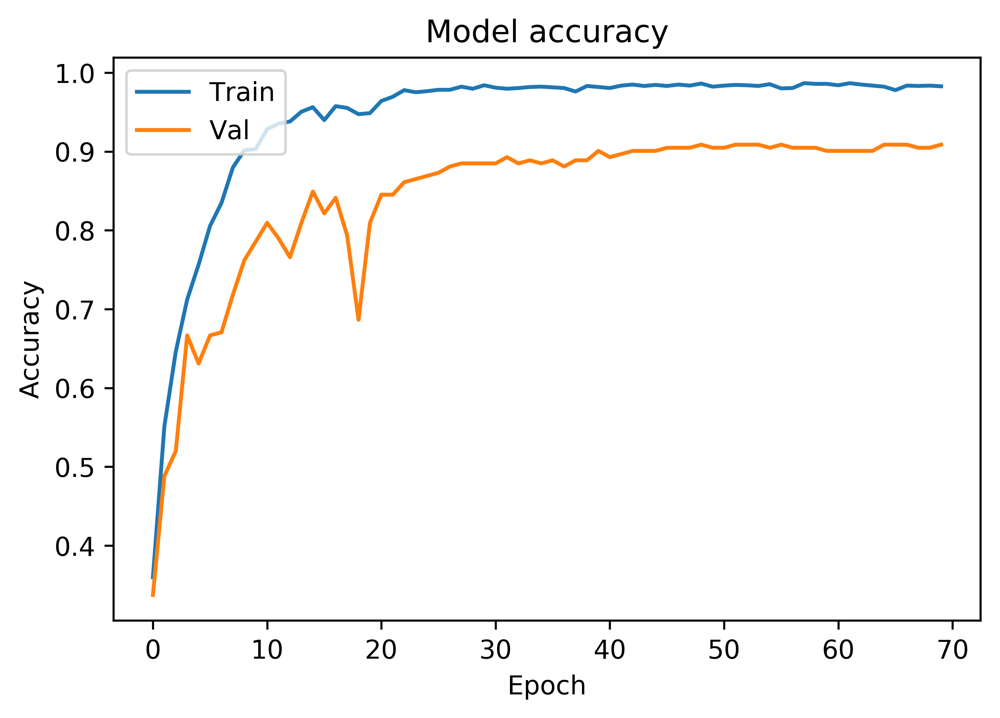

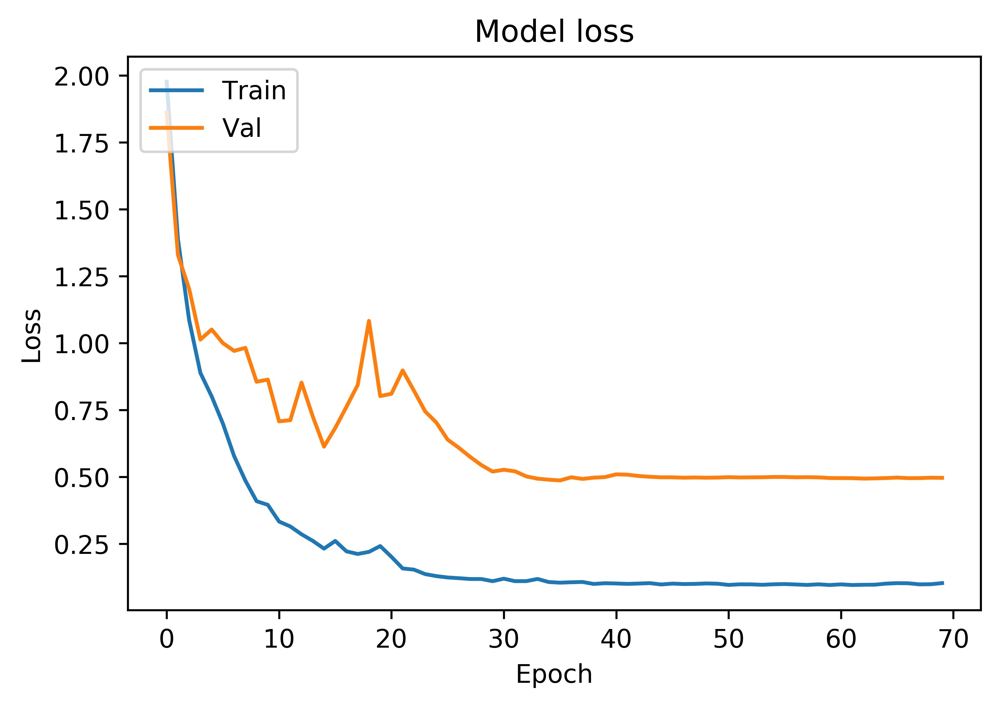

In [26]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### Test model

In [27]:
y_hat = test_model(text_image_model, zip(X_text_test, X_image_test, y_test), image = True, text = True, class_names=class_names)

629/629 [==============================] - 1s 851us/step
[0.5440783766949688, 0.8934817172954117]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         63    0        1     1          3         1     1          2
gel          1   84        2     1          1         0     3          0
network      1    0       58     0          1         0     1          4
plot         8    0        1    70          3         1     2          1
histology    0    1        0     0         75         0     0          0
sequence     1    0        2     0          0        68     0          3
line         2    0        4     8          0         1    71          0
molecular    0    0        1     2          2         0     0         73
              precision    recall  f1-score   support

         bar       0.83      0.88      0.85        72
         gel       0.99      0.91      0.95        92
     network       0.84      0.89      0.87        65
        plot       0.85     

### Inspect misclassifications

blue = ground truth, red = prediction


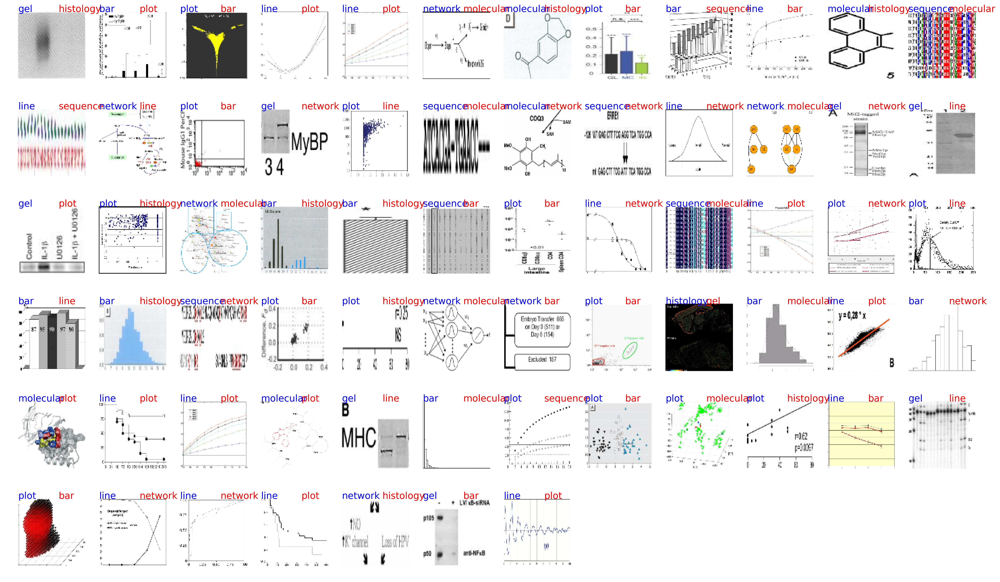

In [28]:
y_hat = text_image_model.predict([X_text_test, X_image_test])
#convert to categorical from one-hot
y_hat_fig = [ np.argmax(t) for t in y_hat ]
y_test_fig = [ np.argmax(t) for t in y_test ]
test_wrong = [im for im in zip(X_image_test, y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')

### Load and test using best val_acc weights

In [29]:
text_image_model.layers[-2].load_weights(filepath)#as per the multigpu checkpoint
#text_image_model.load_weights(filepath)
print('Test on Image + text')
y_hat = test_model(text_image_model, zip(X_text_test, X_image_test, y_test))

Test on Image + text
629/629 [==============================] - 1s 870us/step
[0.5478978147093556, 0.8823529414607535]
    0   1   2   3   4   5   6   7
0  61   1   1   1   4   1   1   2
1   1  84   2   1   1   0   3   0
2   1   0  58   0   1   0   1   4
3   9   1   2  67   3   1   2   1
4   0   1   0   0  75   0   0   0
5   1   0   3   0   0  67   0   3
6   2   0   5   8   0   1  70   0
7   0   0   1   2   2   0   0  73
              precision    recall  f1-score   support

           0       0.81      0.85      0.83        72
           1       0.97      0.91      0.94        92
           2       0.81      0.89      0.85        65
           3       0.85      0.78      0.81        86
           4       0.87      0.99      0.93        76
           5       0.96      0.91      0.93        74
           6       0.91      0.81      0.86        86
           7       0.88      0.94      0.91        78

   micro avg       0.88      0.88      0.88       629
   macro avg       0.88      0.88

### Inspect misclassifications

blue = ground truth, red = prediction


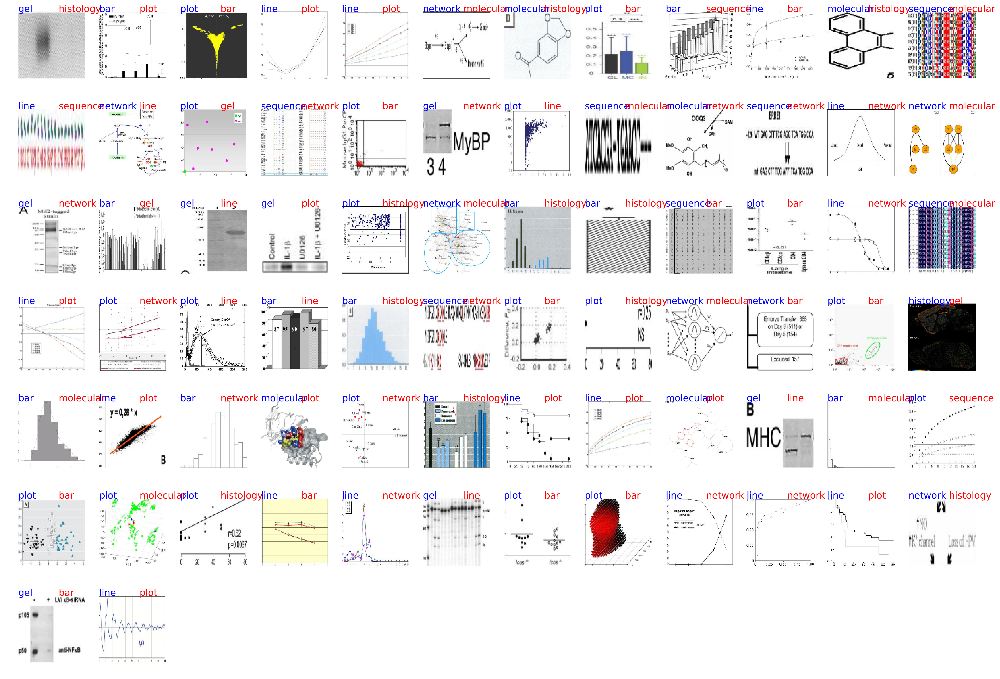

In [30]:
y_hat = text_image_model.predict([X_text_test, X_image_test])
#convert to categorical from one-hot
y_hat_fig = [ np.argmax(t) for t in y_hat ]
y_test_fig = [ np.argmax(t) for t in y_test ]
test_wrong = [im for im in zip(X_image_test, y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')

# Section 3: K-Fold Validation

### Get data into format our model understands

In [31]:
#Get all data to kfoldsplit
X_text, X_image, y, tokenizer = get_model_data(data, seed=seed, test_size = test_size, 
                vocabulary_size = vocabulary_size, filters = filters, 
                max_text_len=max_text_len, shape=shape, split=True)
X_text = np.array(X_text)#need to fix this!!!!!!!!!!!!!!!!!!!!!!!!!!!

filtering sentences
filtering sents and removing stopwords
filtering sentences
filtering sents and removing stopwords


/home/kl533/.local/lib/python3.6/site-packages/sklearn/preprocessing/_encoders.py:363: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


### Load our word embeddings

In [32]:
#%% Section 1.5: Load word embeddings
if use_glove:
    embedding_weights = load_glove('/home/kevin/Downloads', 
                        take(vocabulary_size, tokenizer.word_index.items()))
elif create_word_vec:#get weights from w2v model directly if trained.
    embedding_weights = mapTokensToEmbedding(w2v.get_embeddings(), 
                                             tokenizer.word_index, vocabulary_size)
else:
    #load embedding weights from file
    location = 'w2v_embeddings.json'
    import json
    with open(location) as f:
        embs = json.load(f)
        emb = json.loads(embs)
    embedding_weights = mapTokensToEmbedding(emb, tokenizer.word_index, 
                                             vocabulary_size)

### K fold validation on images only

In [33]:
#set K folds to 5
kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for train, test in kfold.split(np.zeros(len(y)), y.argmax(1)):
    print('K-fold: {}'.format(count))
    random.shuffle(train)
    image_model = Generate_Model(image = True, text=False)
    image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="late_fusion_weights/best_weight_image_only_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = image_model.fit([X_image[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)
    filepath="late_fusion_weights/final_weight_image_only_k-fold_{}.hdf5".format(count)
    image_model.save_weights(filepath)
    scores = image_model.evaluate([X_image[test]], y[test], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(image_model, zip(X_image[test], y[test]), image = True, text = False, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[test]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    report_list.append(classification_report([np.argmax(t) for t in y[test]], y_hat, target_names=class_names))
    count += 1
    print('================================================')
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

K-fold: 1
[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 9s 4ms/step - loss: 2.4297 - acc: 0.3252 - val_loss: 3.9732 - val_acc: 0.3770

Epoch 00001: val_acc improved from -inf to 0.37698, saving model to late_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 2/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.9010 - acc: 0.4531 - val_loss: 1.6924 - val_acc: 0.4960

Epoch 00002: val_acc improved from 0.37698 to 0.49603, saving model to late_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 3/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.4094 - acc: 0.5540 - val_loss: 1.6653 - val_acc: 0.5278

Epoch 00003: val_acc improved from 0.49603 to 0.52778, saving model to late_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 4/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.2139 - acc: 0.6159 - val_loss: 1.4287 - val_

2260/2260 [==============================] - 3s 1ms/step - loss: 0.0165 - acc: 0.9965 - val_loss: 0.5988 - val_acc: 0.8413

Epoch 00037: val_acc did not improve from 0.84127
Epoch 38/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0126 - acc: 0.9973 - val_loss: 0.5932 - val_acc: 0.8373

Epoch 00038: val_acc did not improve from 0.84127
Epoch 39/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0156 - acc: 0.9951 - val_loss: 0.5792 - val_acc: 0.8333

Epoch 00039: val_acc did not improve from 0.84127
Epoch 40/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0161 - acc: 0.9965 - val_loss: 0.5910 - val_acc: 0.8413

Epoch 00040: val_acc did not improve from 0.84127
Epoch 41/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0098 - acc: 0.9987 - val_loss: 0.6035 - val_acc: 0.8373

Epoch 00041: val_acc did not improve from 0.84127
Epoch 42/150
2260/2260 [==============================] - 3s 1ms/step - loss: 

2260/2260 [==============================] - 3s 1ms/step - loss: 0.0082 - acc: 0.9982 - val_loss: 0.7897 - val_acc: 0.7778

Epoch 00045: val_acc did not improve from 0.79365
Epoch 46/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0080 - acc: 0.9991 - val_loss: 0.7849 - val_acc: 0.7817

Epoch 00046: val_acc did not improve from 0.79365
Epoch 47/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0095 - acc: 0.9978 - val_loss: 0.7950 - val_acc: 0.7778

Epoch 00047: val_acc did not improve from 0.79365
Epoch 48/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0105 - acc: 0.9978 - val_loss: 0.7968 - val_acc: 0.7778

Epoch 00048: val_acc did not improve from 0.79365
Epoch 49/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0132 - acc: 0.9956 - val_loss: 0.7978 - val_acc: 0.7778

Epoch 00049: ReduceLROnPlateau reducing learning rate to 1e-06.

Epoch 00049: val_acc did not improve from 0.79365
Epoch 50/150



Epoch 00013: val_acc did not improve from 0.65873
Epoch 14/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2850 - acc: 0.9044 - val_loss: 2.5785 - val_acc: 0.5357

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.

Epoch 00014: val_acc did not improve from 0.65873
Epoch 15/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.1544 - acc: 0.9500 - val_loss: 1.6866 - val_acc: 0.5833

Epoch 00015: val_acc did not improve from 0.65873
Epoch 16/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.1145 - acc: 0.9633 - val_loss: 1.1905 - val_acc: 0.6627

Epoch 00016: val_acc improved from 0.65873 to 0.66270, saving model to late_fusion_weights/best_weight_image_only_k-fold_3.hdf5
Epoch 17/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0815 - acc: 0.9721 - val_loss: 1.1319 - val_acc: 0.6746

Epoch 00017: val_acc improved from 0.66270 to 0.67460, saving model to late_fusion_weights/

[INFO] training with 2 GPUs...
Train on 2268 samples, validate on 252 samples
Epoch 1/150
2268/2268 [==============================] - 11s 5ms/step - loss: 2.4253 - acc: 0.3210 - val_loss: 4.1571 - val_acc: 0.3532

Epoch 00001: val_acc improved from -inf to 0.35317, saving model to late_fusion_weights/best_weight_image_only_k-fold_4.hdf5
Epoch 2/150
2268/2268 [==============================] - 3s 1ms/step - loss: 1.7820 - acc: 0.4828 - val_loss: 2.4730 - val_acc: 0.4921

Epoch 00002: val_acc improved from 0.35317 to 0.49206, saving model to late_fusion_weights/best_weight_image_only_k-fold_4.hdf5
Epoch 3/150
2268/2268 [==============================] - 3s 1ms/step - loss: 1.4800 - acc: 0.5441 - val_loss: 5.6207 - val_acc: 0.3730

Epoch 00003: val_acc did not improve from 0.49206
Epoch 4/150
2268/2268 [==============================] - 3s 1ms/step - loss: 1.1688 - acc: 0.6186 - val_loss: 2.0954 - val_acc: 0.5516

Epoch 00004: val_acc improved from 0.49206 to 0.55159, saving model to lat

2268/2268 [==============================] - 3s 1ms/step - loss: 0.0193 - acc: 0.9951 - val_loss: 0.7026 - val_acc: 0.7976

Epoch 00038: val_acc did not improve from 0.81349
Epoch 39/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0168 - acc: 0.9960 - val_loss: 0.6994 - val_acc: 0.8016

Epoch 00039: val_acc did not improve from 0.81349
Epoch 40/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0151 - acc: 0.9974 - val_loss: 0.6996 - val_acc: 0.7937

Epoch 00040: val_acc did not improve from 0.81349
Epoch 41/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0138 - acc: 0.9974 - val_loss: 0.7033 - val_acc: 0.7897

Epoch 00041: val_acc did not improve from 0.81349
Epoch 42/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0128 - acc: 0.9974 - val_loss: 0.7041 - val_acc: 0.7976

Epoch 00042: val_acc did not improve from 0.81349
Epoch 43/150
2268/2268 [==============================] - 3s 1ms/step - loss: 

2268/2268 [==============================] - 3s 1ms/step - loss: 0.0218 - acc: 0.9956 - val_loss: 0.6972 - val_acc: 0.8056

Epoch 00052: val_acc did not improve from 0.82540
Epoch 53/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0189 - acc: 0.9960 - val_loss: 0.6961 - val_acc: 0.8056

Epoch 00053: val_acc did not improve from 0.82540
Epoch 54/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0269 - acc: 0.9943 - val_loss: 0.6949 - val_acc: 0.8095

Epoch 00054: val_acc did not improve from 0.82540
Epoch 55/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0180 - acc: 0.9969 - val_loss: 0.6963 - val_acc: 0.8095

Epoch 00055: val_acc did not improve from 0.82540
Epoch 56/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0210 - acc: 0.9960 - val_loss: 0.6977 - val_acc: 0.8016

Epoch 00056: val_acc did not improve from 0.82540
Epoch 57/150
2268/2268 [==============================] - 2s 1ms/step - loss: 

### Plot training history

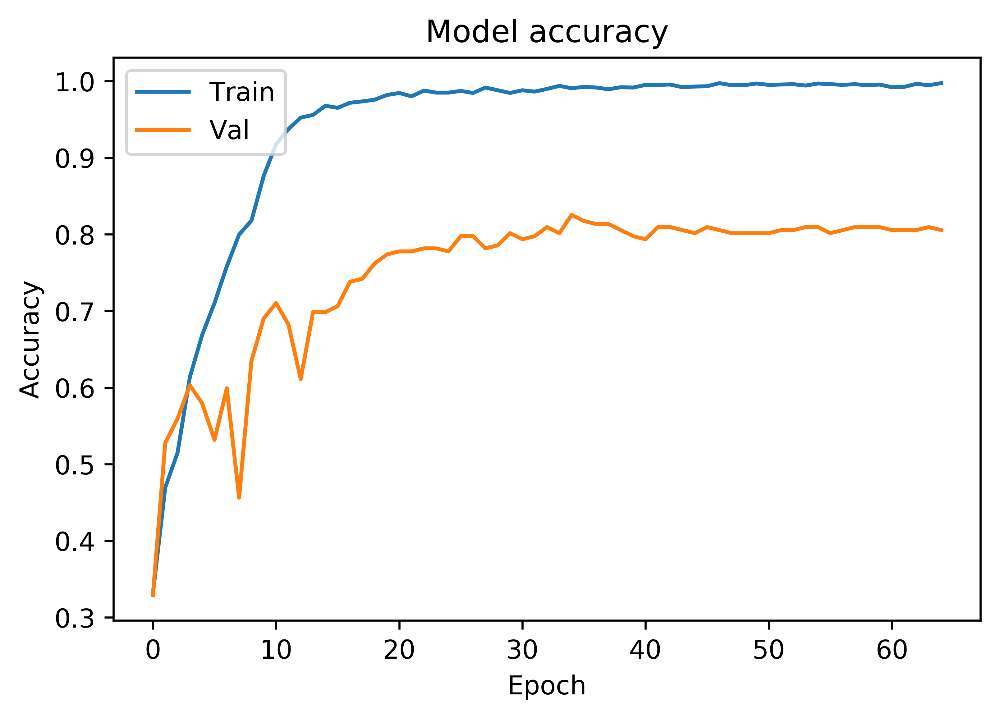

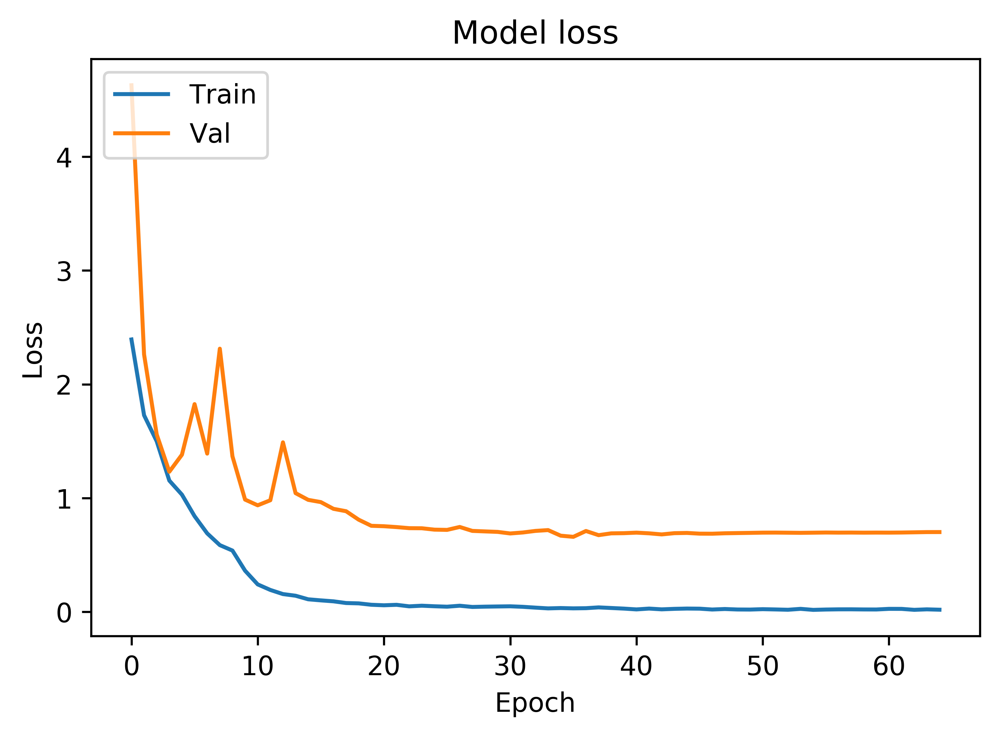

In [34]:
import matplotlib.pyplot as plt
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### K fold validation on text only

In [35]:
#set K folds to 5
kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for train, test in kfold.split(np.zeros(len(y)), y.argmax(1)):
    print('K-fold: {}'.format(count))
    random.shuffle(train)
    text_model = Generate_Model(image = False, text=True)
    text_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="late_fusion_weights/best_weight_text_only_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = text_model.fit([X_text[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)
    filepath="late_fusion_weights/final_weight_text_only_k-fold_{}.hdf5".format(count)
    text_model.save_weights(filepath)
    scores = text_model.evaluate([X_text[test]], y[test], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(text_model, zip(X_text[test], y[test]), image = False, text = True, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[test]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    report_list.append(classification_report([np.argmax(t) for t in y[test]], y_hat, target_names=class_names))
    count += 1
    print('================================================')
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

K-fold: 1
[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 10s 4ms/step - loss: 2.7699 - acc: 0.2177 - val_loss: 1.9912 - val_acc: 0.3929

Epoch 00001: val_acc improved from -inf to 0.39286, saving model to late_fusion_weights/best_weight_text_only_k-fold_1.hdf5
Epoch 2/150
2260/2260 [==============================] - 0s 167us/step - loss: 2.0150 - acc: 0.3611 - val_loss: 1.4533 - val_acc: 0.5198

Epoch 00002: val_acc improved from 0.39286 to 0.51984, saving model to late_fusion_weights/best_weight_text_only_k-fold_1.hdf5
Epoch 3/150
2260/2260 [==============================] - 0s 152us/step - loss: 1.5432 - acc: 0.4996 - val_loss: 1.2081 - val_acc: 0.6389

Epoch 00003: val_acc improved from 0.51984 to 0.63889, saving model to late_fusion_weights/best_weight_text_only_k-fold_1.hdf5
Epoch 4/150
2260/2260 [==============================] - 0s 156us/step - loss: 1.2173 - acc: 0.5894 - val_loss: 1.1108 - 

[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 10s 4ms/step - loss: 2.8523 - acc: 0.2119 - val_loss: 1.7315 - val_acc: 0.3651

Epoch 00001: val_acc improved from -inf to 0.36508, saving model to late_fusion_weights/best_weight_text_only_k-fold_2.hdf5
Epoch 2/150
2260/2260 [==============================] - 0s 165us/step - loss: 2.0869 - acc: 0.3403 - val_loss: 1.3831 - val_acc: 0.5238

Epoch 00002: val_acc improved from 0.36508 to 0.52381, saving model to late_fusion_weights/best_weight_text_only_k-fold_2.hdf5
Epoch 3/150
2260/2260 [==============================] - 0s 158us/step - loss: 1.6328 - acc: 0.4730 - val_loss: 1.2612 - val_acc: 0.5675

Epoch 00003: val_acc improved from 0.52381 to 0.56746, saving model to late_fusion_weights/best_weight_text_only_k-fold_2.hdf5
Epoch 4/150
2260/2260 [==============================] - 0s 170us/step - loss: 1.3636 - acc: 0.5553 - val_loss: 1.1215 - val_acc: 0

2260/2260 [==============================] - 0s 154us/step - loss: 0.2339 - acc: 0.9248 - val_loss: 0.8882 - val_acc: 0.8135

Epoch 00025: val_acc did not improve from 0.81349
Epoch 26/150
2260/2260 [==============================] - 0s 153us/step - loss: 0.2292 - acc: 0.9221 - val_loss: 0.8952 - val_acc: 0.8175

Epoch 00026: val_acc improved from 0.81349 to 0.81746, saving model to late_fusion_weights/best_weight_text_only_k-fold_3.hdf5
Epoch 27/150
2260/2260 [==============================] - 0s 166us/step - loss: 0.2052 - acc: 0.9270 - val_loss: 0.8901 - val_acc: 0.8095

Epoch 00027: val_acc did not improve from 0.81746
Epoch 28/150
2260/2260 [==============================] - 0s 152us/step - loss: 0.2273 - acc: 0.9252 - val_loss: 0.8952 - val_acc: 0.8095

Epoch 00028: val_acc did not improve from 0.81746
Epoch 29/150
2260/2260 [==============================] - 0s 151us/step - loss: 0.2125 - acc: 0.9235 - val_loss: 0.8980 - val_acc: 0.8095

Epoch 00029: ReduceLROnPlateau reducing l

Epoch 17/150
2268/2268 [==============================] - 0s 176us/step - loss: 0.2446 - acc: 0.9211 - val_loss: 1.0493 - val_acc: 0.7619

Epoch 00017: val_acc did not improve from 0.76190
Epoch 18/150
2268/2268 [==============================] - 0s 157us/step - loss: 0.2242 - acc: 0.9277 - val_loss: 1.0357 - val_acc: 0.7579

Epoch 00018: val_acc did not improve from 0.76190
Epoch 19/150
2268/2268 [==============================] - 0s 153us/step - loss: 0.2169 - acc: 0.9224 - val_loss: 1.0672 - val_acc: 0.7579

Epoch 00019: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.

Epoch 00019: val_acc did not improve from 0.76190
Epoch 20/150
2268/2268 [==============================] - 0s 151us/step - loss: 0.2128 - acc: 0.9272 - val_loss: 1.0773 - val_acc: 0.7619

Epoch 00020: val_acc did not improve from 0.76190
Epoch 21/150
2268/2268 [==============================] - 0s 153us/step - loss: 0.2049 - acc: 0.9330 - val_loss: 1.0762 - val_acc: 0.7619

Epoch 00021: val_acc di

### Plot training history

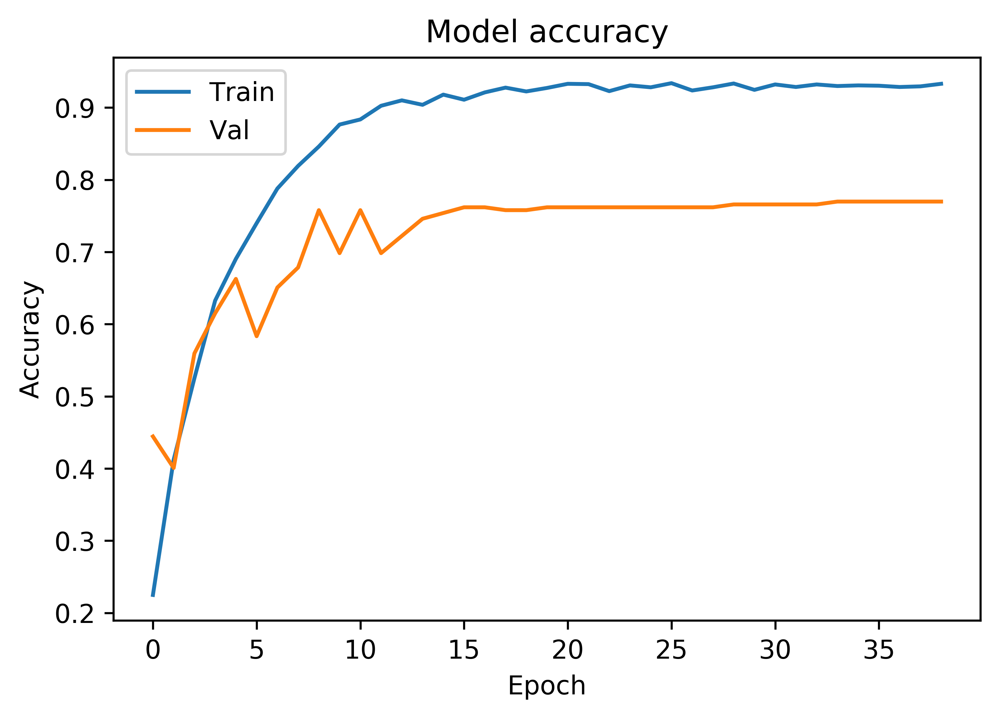

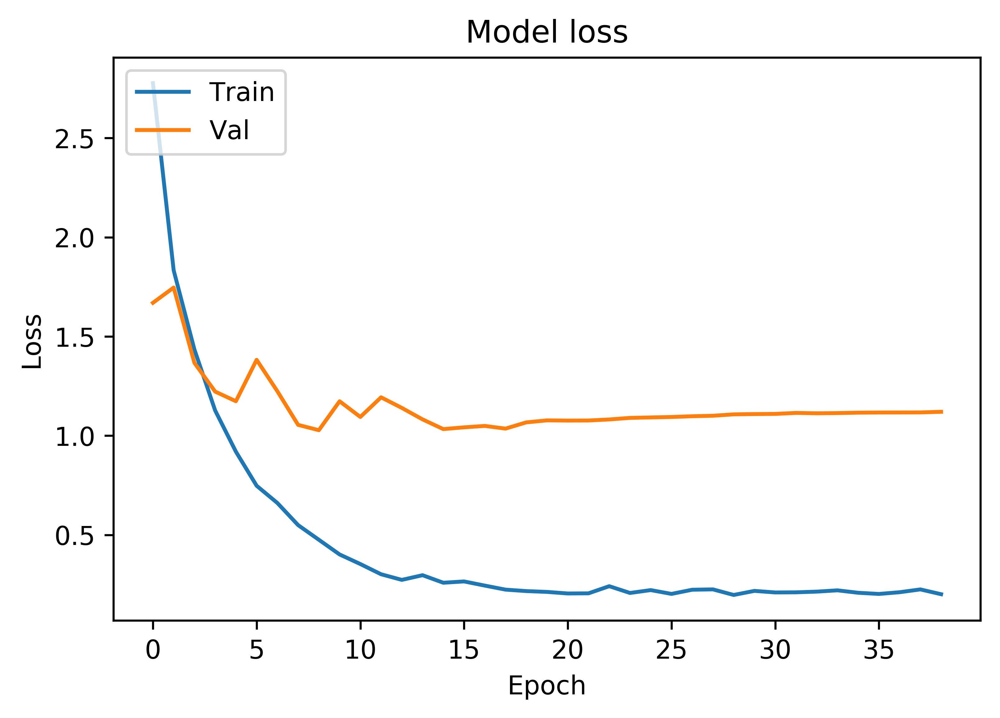

In [36]:
import matplotlib.pyplot as plt
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### K-Fold validation Multimodal: Train text and images separately

In [37]:
'''Have to make the y_train onehot encoded otherwise it wont predict properly'''
'''When using validation_split = 0.10 it takes last 10% of data, so if 
your kfold does not shuffle it well enough it will give low validation 
accuracy, and in this case it wont even train class 16 well. Class 16
is the last class in the list. By coincidence, we have 314 images per 
class in our training set. When we pull the last 10 percent of the images
for validation, it is also 314 images, exactly missing one class. This
is why we get such a low validation score, it does not see one class and
cant really train that well because of it. It improves a little, but is crap.
Keras Documentation: validation_split: Float between 0 and 1. Fraction 
of the training data to be used as validation data. The model will set 
apart this fraction of the training data, will not train on it, and will 
evaluate the loss and any model metrics on this data at the end of each 
epoch. The validation data is selected from the last samples in the 
x and y data provided, before shuffling.
Performing random.shuffle(train) solves the problem
'''

#set K folds to 5
kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for train, test in kfold.split(np.zeros(len(y)), y.argmax(1)):
    print('K-fold: {}'.format(count))
    random.shuffle(train)
    filepath="late_fusion_weights/best_weight_image_text_separate_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]
    sub_callbacks_list = [reduce_lr, early_stopping]
    #Train images
    image_model = Generate_Model(image = True, text=False)
    image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    image_history = image_model.fit([X_image[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=sub_callbacks_list)
    
    #Train text
    text_model = Generate_Model(image = False, text=True)
    text_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    text_history = text_model.fit([X_text[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=sub_callbacks_list)
    
    #Take the image model and text model and merge it
    outputs = [model.outputs[0] for model in [text_model, image_model]]
    output = Average()(outputs)    
    text_image_model = Model(inputs=[text_model.input, image_model.input], outputs=[output])
    text_image_model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
    filepath="late_fusion_weights/final_weight_image_text_separate_k-fold_{}.hdf5".format(count)
    text_image_model.save_weights(filepath)
    scores = text_image_model.evaluate([X_text[test], X_image[test]], y[test], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (text_image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(text_image_model, zip(X_text[test], X_image[test], y[test]), image = True, text = True, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[test]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    report_list.append(classification_report([np.argmax(t) for t in y[test]], y_hat, target_names=class_names))
    count += 1
    print('================================================')
    
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

K-fold: 1
[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 15s 7ms/step - loss: 2.3663 - acc: 0.3305 - val_loss: 3.7143 - val_acc: 0.3492
Epoch 2/150
2260/2260 [==============================] - 2s 1ms/step - loss: 1.8293 - acc: 0.4403 - val_loss: 2.6099 - val_acc: 0.4246
Epoch 3/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.4605 - acc: 0.5420 - val_loss: 1.9672 - val_acc: 0.5159
Epoch 4/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.1433 - acc: 0.6327 - val_loss: 1.4690 - val_acc: 0.5754
Epoch 5/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.9947 - acc: 0.6712 - val_loss: 1.1550 - val_acc: 0.6548
Epoch 6/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.8419 - acc: 0.7159 - val_loss: 1.0841 - val_acc: 0.6706
Epoch 7/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.7078 - acc: 0.7531 - v

2260/2260 [==============================] - 3s 1ms/step - loss: 0.2862 - acc: 0.9066 - val_loss: 1.3010 - val_acc: 0.6429
Epoch 14/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.2915 - acc: 0.9031 - val_loss: 1.2119 - val_acc: 0.6627
Epoch 15/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2602 - acc: 0.9186 - val_loss: 1.0690 - val_acc: 0.7024

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
Epoch 16/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.1761 - acc: 0.9451 - val_loss: 0.7992 - val_acc: 0.7381
Epoch 17/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0959 - acc: 0.9712 - val_loss: 0.7638 - val_acc: 0.7540
Epoch 18/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0679 - acc: 0.9757 - val_loss: 0.6686 - val_acc: 0.7778
Epoch 19/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0564 - acc: 0.9836 - val_loss: 0.63

2260/2260 [==============================] - 0s 156us/step - loss: 0.2331 - acc: 0.9257 - val_loss: 1.0113 - val_acc: 0.7817

Epoch 00019: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.
Epoch 20/150
2260/2260 [==============================] - 0s 157us/step - loss: 0.2282 - acc: 0.9235 - val_loss: 1.0127 - val_acc: 0.7817
Epoch 21/150
2260/2260 [==============================] - 0s 156us/step - loss: 0.2319 - acc: 0.9252 - val_loss: 1.0247 - val_acc: 0.7778
Epoch 22/150
2260/2260 [==============================] - 0s 171us/step - loss: 0.2294 - acc: 0.9230 - val_loss: 1.0319 - val_acc: 0.7778
Epoch 23/150
2260/2260 [==============================] - 0s 159us/step - loss: 0.2144 - acc: 0.9319 - val_loss: 1.0436 - val_acc: 0.7738
Epoch 24/150
2260/2260 [==============================] - 0s 159us/step - loss: 0.2361 - acc: 0.9226 - val_loss: 1.0482 - val_acc: 0.7698

Epoch 00024: ReduceLROnPlateau reducing learning rate to 8.000000525498762e-06.
Epoch 25/150
2260/2260

Epoch 7/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.7626 - acc: 0.7438 - val_loss: 1.4736 - val_acc: 0.5476
Epoch 8/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.6582 - acc: 0.7810 - val_loss: 1.4467 - val_acc: 0.6071
Epoch 9/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.5371 - acc: 0.8168 - val_loss: 1.7695 - val_acc: 0.5595
Epoch 10/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.4142 - acc: 0.8584 - val_loss: 2.5504 - val_acc: 0.5119
Epoch 11/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.3709 - acc: 0.8770 - val_loss: 1.5531 - val_acc: 0.6032
Epoch 12/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.3393 - acc: 0.8858 - val_loss: 1.1979 - val_acc: 0.6627
Epoch 13/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2889 - acc: 0.8987 - val_loss: 0.9327 - val_acc: 0.7262
Epoch 14/150
2260/2260 [===========================


Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
Epoch 13/150
2260/2260 [==============================] - 0s 177us/step - loss: 0.2818 - acc: 0.9106 - val_loss: 1.0088 - val_acc: 0.7579
Epoch 14/150
2260/2260 [==============================] - 0s 161us/step - loss: 0.2656 - acc: 0.9119 - val_loss: 0.9727 - val_acc: 0.7778
Epoch 15/150
2260/2260 [==============================] - 0s 165us/step - loss: 0.2561 - acc: 0.9159 - val_loss: 0.9433 - val_acc: 0.7778
Epoch 16/150
2260/2260 [==============================] - 0s 172us/step - loss: 0.2535 - acc: 0.9199 - val_loss: 0.9395 - val_acc: 0.7778
Epoch 17/150
2260/2260 [==============================] - 0s 160us/step - loss: 0.2448 - acc: 0.9181 - val_loss: 0.9544 - val_acc: 0.7897

Epoch 00017: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.
Epoch 18/150
2260/2260 [==============================] - 0s 158us/step - loss: 0.2384 - acc: 0.9226 - val_loss: 0.9582 - val_acc: 0.7897
Epoch 19

Epoch 13/150
2268/2268 [==============================] - 0s 163us/step - loss: 0.3497 - acc: 0.8907 - val_loss: 1.4133 - val_acc: 0.6746

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
Epoch 14/150
2268/2268 [==============================] - 0s 193us/step - loss: 0.2811 - acc: 0.9074 - val_loss: 1.3397 - val_acc: 0.7063
Epoch 15/150
2268/2268 [==============================] - 0s 161us/step - loss: 0.2770 - acc: 0.9096 - val_loss: 1.2987 - val_acc: 0.6944
Epoch 16/150
2268/2268 [==============================] - 0s 165us/step - loss: 0.2662 - acc: 0.9083 - val_loss: 1.2601 - val_acc: 0.6944
Epoch 17/150
2268/2268 [==============================] - 0s 163us/step - loss: 0.2633 - acc: 0.9158 - val_loss: 1.2587 - val_acc: 0.7143
Epoch 18/150
2268/2268 [==============================] - 0s 162us/step - loss: 0.2476 - acc: 0.9193 - val_loss: 1.2751 - val_acc: 0.7063

Epoch 00018: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.
Epoch 19

Epoch 27/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0239 - acc: 0.9934 - val_loss: 0.7680 - val_acc: 0.8016
Epoch 28/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0210 - acc: 0.9951 - val_loss: 0.7559 - val_acc: 0.7937
Epoch 29/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0216 - acc: 0.9934 - val_loss: 0.7609 - val_acc: 0.7976
Epoch 30/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0191 - acc: 0.9956 - val_loss: 0.7559 - val_acc: 0.7976
Epoch 31/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0159 - acc: 0.9965 - val_loss: 0.7549 - val_acc: 0.7937
Epoch 32/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0197 - acc: 0.9943 - val_loss: 0.7597 - val_acc: 0.7976
Epoch 33/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0155 - acc: 0.9974 - val_loss: 0.7611 - val_acc: 0.7976
Epoch 34/150
2268/2268 [========================

### Plot training history

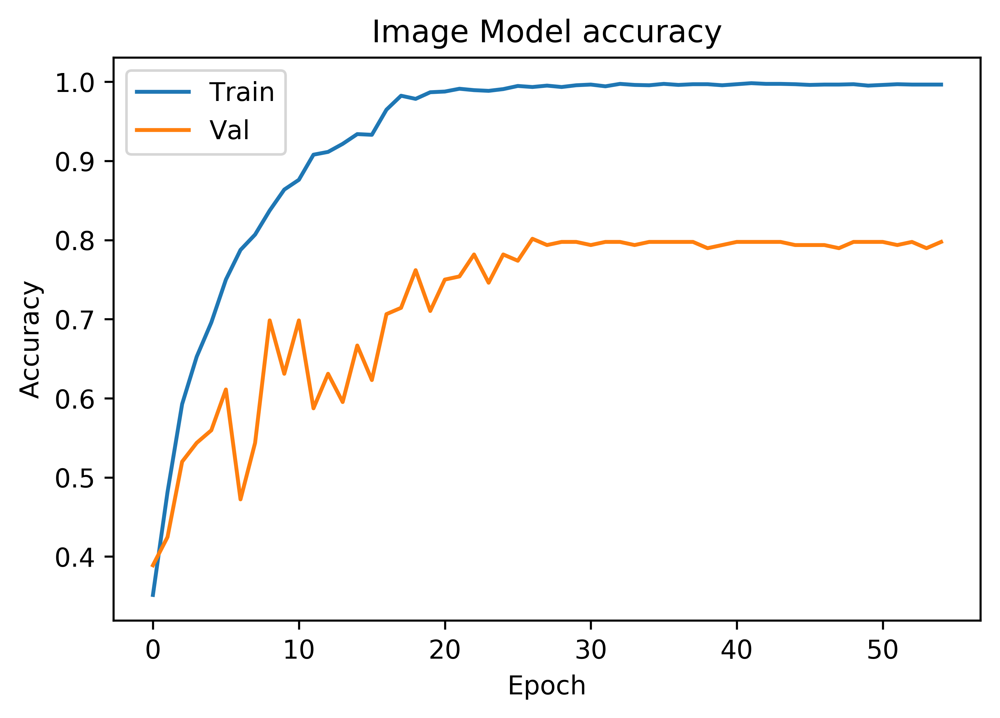

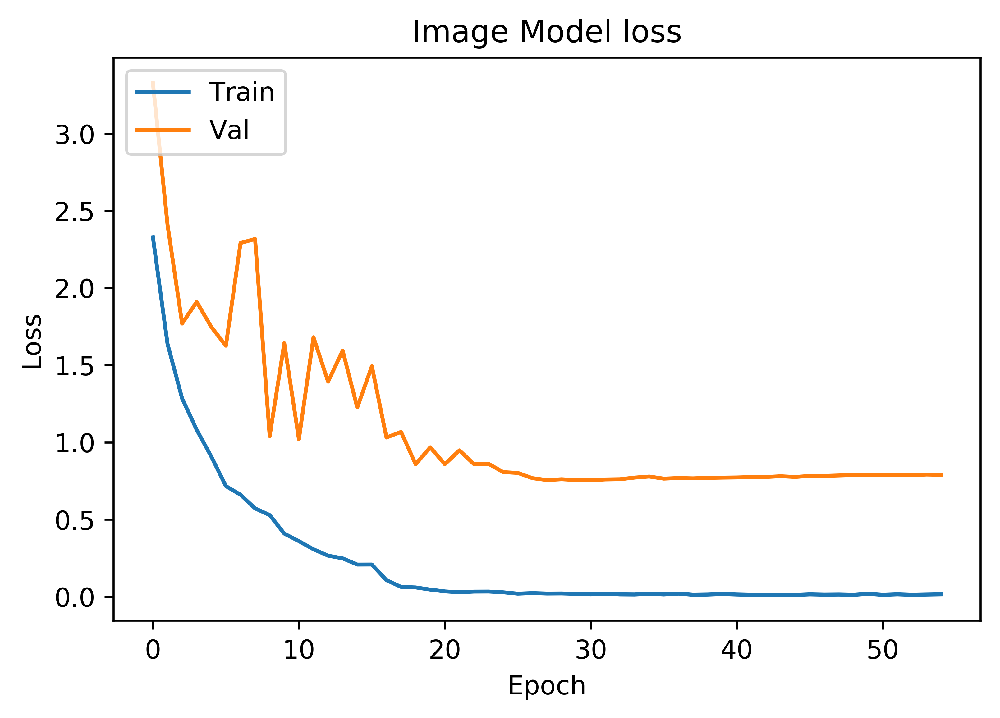

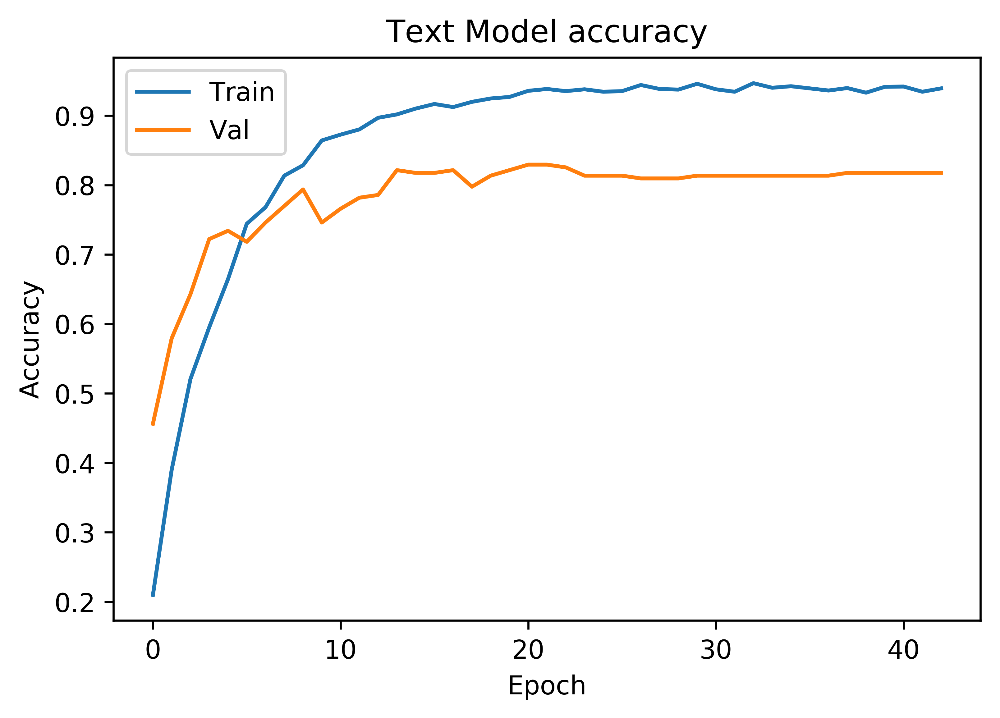

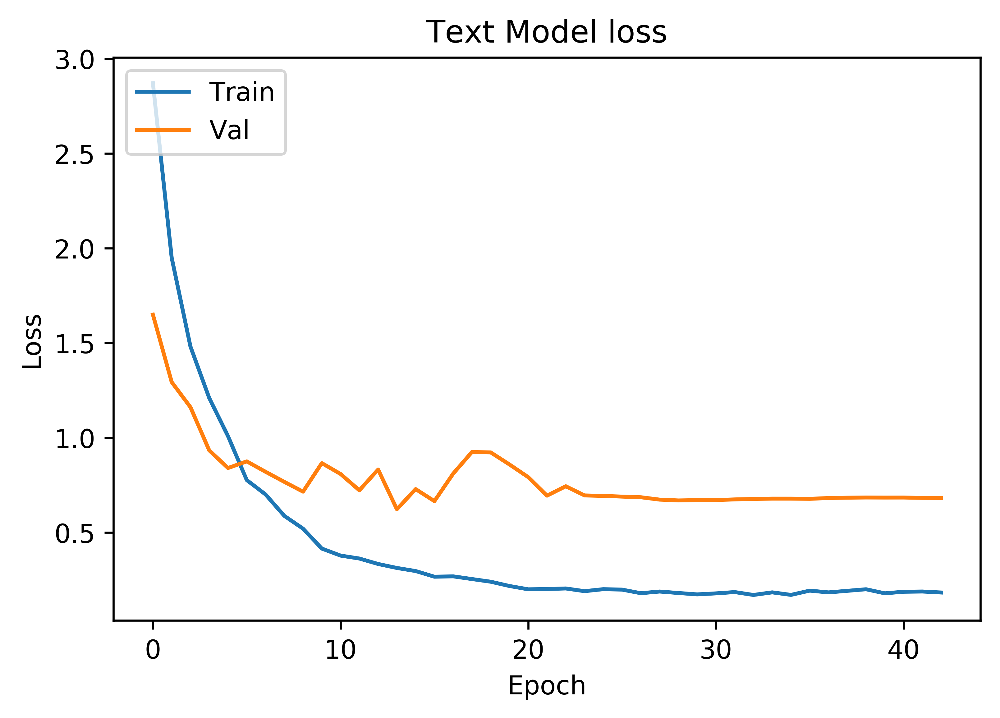

In [38]:
import matplotlib.pyplot as plt
image_history
text_history
# Plot image training & validation accuracy values
plt.plot(image_history.history['acc'])
plt.plot(image_history.history['val_acc'])
plt.title('Image Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot image training & validation loss values
plt.plot(image_history.history['loss'])
plt.plot(image_history.history['val_loss'])
plt.title('Image Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot text training & validation accuracy values
plt.plot(text_history.history['acc'])
plt.plot(text_history.history['val_acc'])
plt.title('Text Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot text training & validation loss values
plt.plot(text_history.history['loss'])
plt.plot(text_history.history['val_loss'])
plt.title('Text Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

blue = ground truth, red = prediction


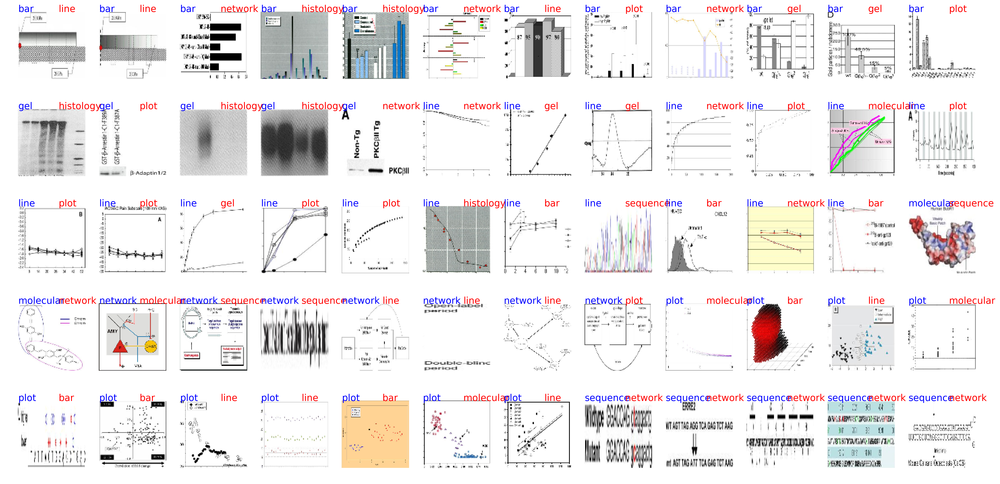

In [39]:
#convert to categorical from one-hot
y_hat_fig = y_hat#[ np.argmax(t) for t in y_hat ] #y_hat is already in the encoded format
y_test_fig = [ np.argmax(t) for t in y[test] ]
test_wrong = [im for im in zip(X_image[test], y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')

### K-Fold validation Multimodal: text and images together

In [40]:
'''Have to make the y_train onehot encoded otherwise it wont predict properly'''
'''When using validation_split = 0.10 it takes last 10% of data, so if 
your kfold does not shuffle it well enough it will give low validation 
accuracy, and in this case it wont even train class 16 well. Class 16
is the last class in the list. By coincidence, we have 314 images per 
class in our training set. When we pull the last 10 percent of the images
for validation, it is also 314 images, exactly missing one class. This
is why we get such a low validation score, it does not see one class and
cant really train that well because of it. It improves a little, but is crap.
Keras Documentation: validation_split: Float between 0 and 1. Fraction 
of the training data to be used as validation data. The model will set 
apart this fraction of the training data, will not train on it, and will 
evaluate the loss and any model metrics on this data at the end of each 
epoch. The validation data is selected from the last samples in the 
x and y data provided, before shuffling.
Performing random.shuffle(train) solves the problem
'''

#set K folds to 5
kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for train, test in kfold.split(np.zeros(len(y)), y.argmax(1)):
    print('K-fold: {}'.format(count))
    random.shuffle(train)
    text_image_model = Generate_Model(image = True, text=True)
    text_image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="late_fusion_weights/best_weight_image_text_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = text_image_model.fit([X_text[train], X_image[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)
    filepath="late_fusion_weights/final_weight_image_text_k-fold_{}.hdf5".format(count)
    text_image_model.save_weights(filepath)
    scores = text_image_model.evaluate([X_text[test], X_image[test]], y[test], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (text_image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(text_image_model, zip(X_text[test], X_image[test], y[test]), image = True, text = True, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[test]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    report_list.append(classification_report([np.argmax(t) for t in y[test]], y_hat, target_names=class_names))
    count += 1
    print('================================================')
    
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

K-fold: 1
[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 28s 12ms/step - loss: 1.9805 - acc: 0.3624 - val_loss: 1.8384 - val_acc: 0.4286

Epoch 00001: val_acc improved from -inf to 0.42857, saving model to late_fusion_weights/best_weight_image_text_k-fold_1.hdf5
Epoch 2/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.4869 - acc: 0.5221 - val_loss: 1.4261 - val_acc: 0.4960

Epoch 00002: val_acc improved from 0.42857 to 0.49603, saving model to late_fusion_weights/best_weight_image_text_k-fold_1.hdf5
Epoch 3/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.1625 - acc: 0.6288 - val_loss: 1.1893 - val_acc: 0.5675

Epoch 00003: val_acc improved from 0.49603 to 0.56746, saving model to late_fusion_weights/best_weight_image_text_k-fold_1.hdf5
Epoch 4/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.9326 - acc: 0.7111 - val_loss: 1.4594 - va


Epoch 00037: val_acc did not improve from 0.86905
Epoch 38/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.1182 - acc: 0.9819 - val_loss: 0.5241 - val_acc: 0.8730

Epoch 00038: val_acc improved from 0.86905 to 0.87302, saving model to late_fusion_weights/best_weight_image_text_k-fold_1.hdf5
Epoch 39/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.1089 - acc: 0.9872 - val_loss: 0.5303 - val_acc: 0.8413

Epoch 00039: val_acc did not improve from 0.87302
Epoch 40/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.1087 - acc: 0.9827 - val_loss: 0.5363 - val_acc: 0.8492

Epoch 00040: val_acc did not improve from 0.87302
Epoch 41/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.1058 - acc: 0.9788 - val_loss: 0.5542 - val_acc: 0.8770

Epoch 00041: val_acc improved from 0.87302 to 0.87698, saving model to late_fusion_weights/best_weight_image_text_k-fold_1.hdf5
Epoch 42/150
2260/2260 [=====================

Epoch 16/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2357 - acc: 0.9518 - val_loss: 1.1243 - val_acc: 0.7500

Epoch 00016: val_acc did not improve from 0.86508
Epoch 17/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2101 - acc: 0.9633 - val_loss: 0.6575 - val_acc: 0.8095

Epoch 00017: val_acc did not improve from 0.86508
Epoch 18/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2112 - acc: 0.9522 - val_loss: 0.5202 - val_acc: 0.8690

Epoch 00018: val_acc improved from 0.86508 to 0.86905, saving model to late_fusion_weights/best_weight_image_text_k-fold_2.hdf5
Epoch 19/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2300 - acc: 0.9496 - val_loss: 0.6952 - val_acc: 0.8571

Epoch 00019: val_acc did not improve from 0.86905
Epoch 20/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2205 - acc: 0.9522 - val_loss: 0.7182 - val_acc: 0.8532

Epoch 00020: val_acc did not improve 


Epoch 00012: val_acc improved from 0.71825 to 0.72222, saving model to late_fusion_weights/best_weight_image_text_k-fold_3.hdf5
Epoch 13/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2776 - acc: 0.9354 - val_loss: 1.1622 - val_acc: 0.6865

Epoch 00013: val_acc did not improve from 0.72222
Epoch 14/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2526 - acc: 0.9447 - val_loss: 1.0767 - val_acc: 0.7183

Epoch 00014: val_acc did not improve from 0.72222
Epoch 15/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2388 - acc: 0.9518 - val_loss: 1.0937 - val_acc: 0.7460

Epoch 00015: val_acc improved from 0.72222 to 0.74603, saving model to late_fusion_weights/best_weight_image_text_k-fold_3.hdf5
Epoch 16/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2672 - acc: 0.9279 - val_loss: 0.8563 - val_acc: 0.7659

Epoch 00016: val_acc improved from 0.74603 to 0.76587, saving model to late_fusion_weights/best

2268/2268 [==============================] - 3s 1ms/step - loss: 0.2011 - acc: 0.9674 - val_loss: 0.9038 - val_acc: 0.7738

Epoch 00018: val_acc did not improve from 0.80556
Epoch 19/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.1812 - acc: 0.9705 - val_loss: 0.8340 - val_acc: 0.7738

Epoch 00019: val_acc did not improve from 0.80556
Epoch 20/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.1637 - acc: 0.9771 - val_loss: 0.8039 - val_acc: 0.7778

Epoch 00020: val_acc did not improve from 0.80556
Epoch 21/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.1513 - acc: 0.9749 - val_loss: 0.7808 - val_acc: 0.7817

Epoch 00021: val_acc did not improve from 0.80556
Epoch 22/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.1562 - acc: 0.9793 - val_loss: 0.7956 - val_acc: 0.7857

Epoch 00022: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.

Epoch 00022: val_acc did not improve from 0.80


Epoch 00057: ReduceLROnPlateau reducing learning rate to 1e-06.

Epoch 00057: val_acc did not improve from 0.84921
Epoch 58/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.1080 - acc: 0.9854 - val_loss: 0.6519 - val_acc: 0.8373

Epoch 00058: val_acc did not improve from 0.84921
Epoch 59/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.1116 - acc: 0.9841 - val_loss: 0.6539 - val_acc: 0.8373

Epoch 00059: val_acc did not improve from 0.84921
Epoch 60/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.1102 - acc: 0.9872 - val_loss: 0.6519 - val_acc: 0.8373

Epoch 00060: val_acc did not improve from 0.84921
Epoch 61/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.1086 - acc: 0.9841 - val_loss: 0.6533 - val_acc: 0.8373

Epoch 00061: val_acc did not improve from 0.84921
Epoch 62/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.1092 - acc: 0.9837 - val_loss: 0.6555 - val_acc: 0.8373


### Plot training history

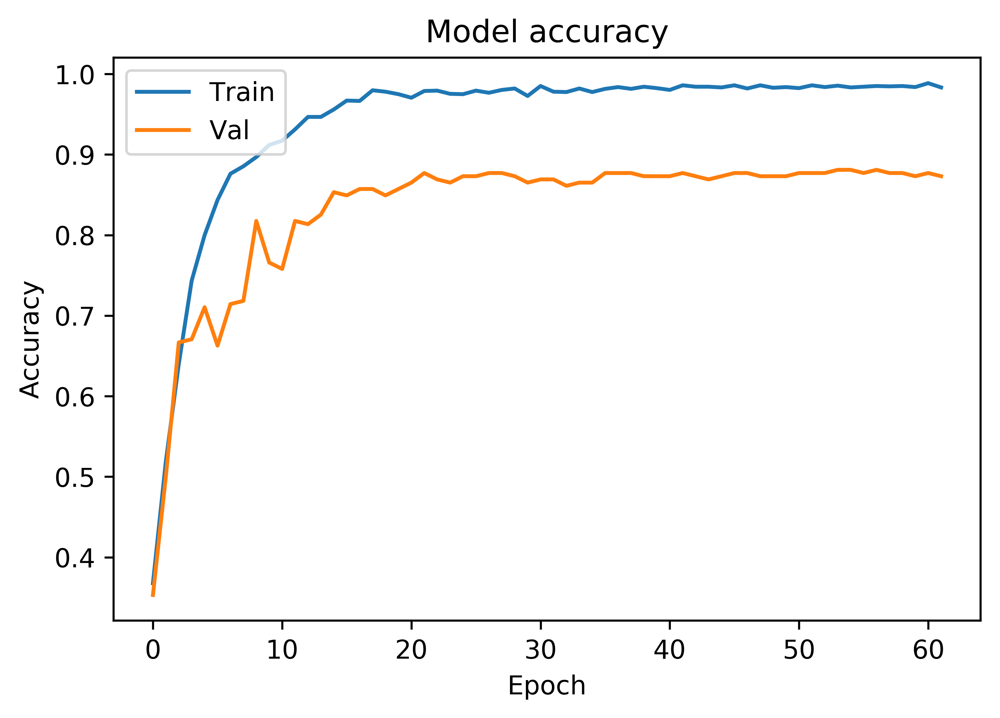

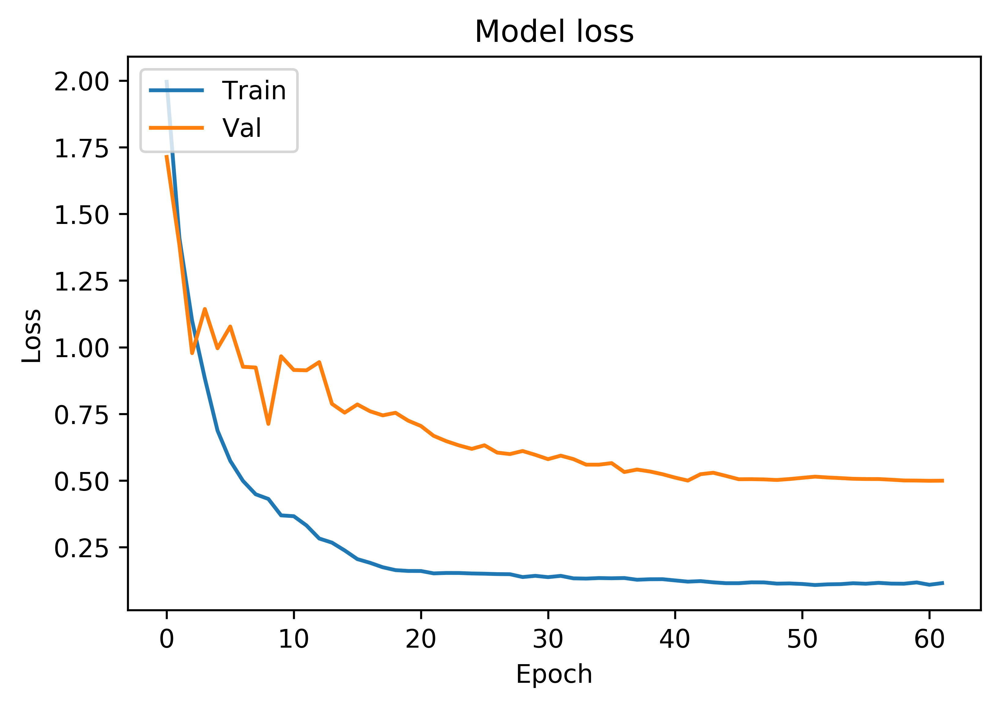

In [41]:
import matplotlib.pyplot as plt
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### View images

blue = ground truth, red = prediction


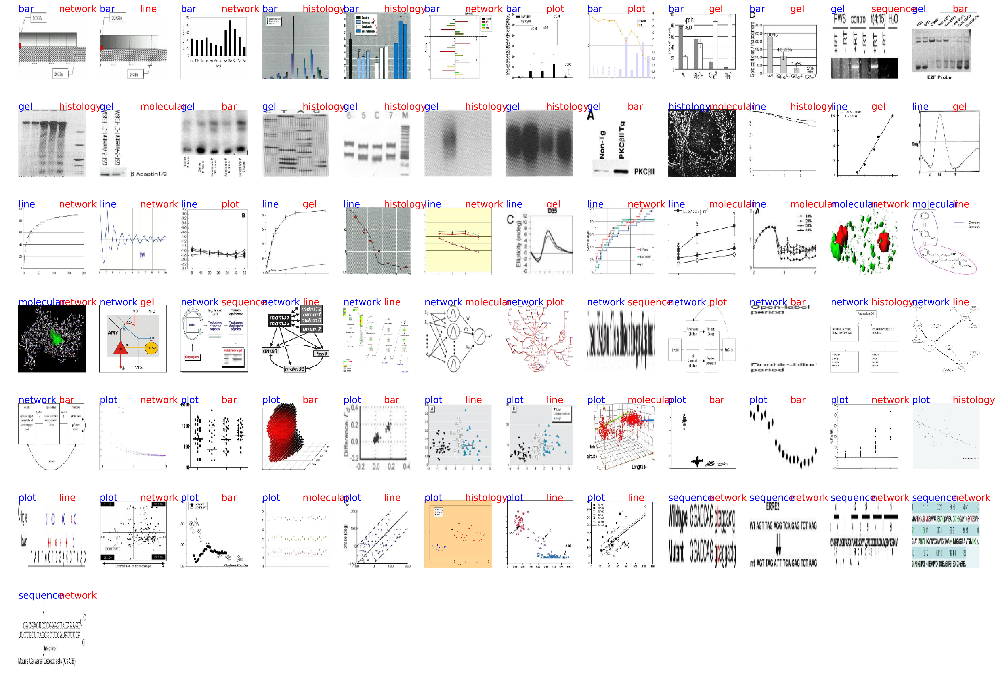

In [42]:
#convert to categorical from one-hot
y_hat_fig = y_hat#[ np.argmax(t) for t in y_hat ] #y_hat is already in the encoded format
y_test_fig = [ np.argmax(t) for t in y[test] ]
test_wrong = [im for im in zip(X_image[test], y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')